In [86]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from tqdm.auto import tqdm

from torchdiffeq import odeint_adjoint as odeint
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [154]:
STEP = 0.001

class Uniform(nn.Module): # y' = y / x
    def forward(self, x, y):
        return y / (x + 1e-10)


class Saddle(nn.Module): # y' = -y / x
    def forward(self, x, y):
        return -y / (x + 1e-10)


# class Center(nn.Module): # y' = -x / y
#     def forward(self, x, y):
#         return -x / (y + 1e-10)


# class Spiral(nn.Module): # y' = (x + y) / (x - y)
#     def forward(self, x, y):
#         return (x + y) / (x - y + 1e-10)

In [114]:
class ODE_Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(1, 64),
            nn.Tanh(),
            nn.Linear(64, 64),
            nn.Tanh(),
            nn.Linear(64, 1))

    def forward(self, t, h):
        return self.net(h)

In [49]:
y0s = torch.Tensor(np.arange(-1,1.001, 0.001).reshape(-1,1))
X_neg = torch.Tensor(np.arange(-1, 0, STEP))
# X_pos = torch.Tensor(np.arange(1, 0+STEP, -STEP))

true_y_uniform_neg = odeint(Uniform(), y0s, X_neg)
true_y_saddle_neg = odeint(Saddle(), y0s, X_neg)
true_y_center_neg = odeint(Center(), y0s, X_neg)
true_y_spiral_neg = odeint(Spiral(), y0s, X_neg)

# true_y_uniform_pos = odeint(Uniform(), y0s, X_pos)
# true_y_saddle_pos = odeint(Saddle(), y0s, X_pos)
# true_y_center_pos = odeint(Center(), y0s, X_pos)
# true_y_spiral_pos = odeint(Spiral(), y0s, X_pos)

In [152]:
def get_data(true_y_neg, batch_time=32):
    index_range = np.arange(1000)
    x0_neg = np.random.choice(index_range[:-batch_time])
    idx_neg = torch.tensor(np.array([x0_neg + i for i in range(batch_time)]))
    batch_y_neg = true_y_neg[idx_neg]
   
    return batch_y_neg[0], X_neg[idx_neg], batch_y_neg

In [146]:
def visualize(true_h, pred_h=None, name="", reflect=False):
    plt.figure(figsize=(6, 6))
    for i in range(0, true_h.shape[1], 100):
        plt.plot(X_neg.numpy(), true_h[:,i,:].numpy(), color=sns.color_palette()[0])
        plt.plot(X_neg.numpy(), pred_h[:,i,:].numpy(), color=sns.color_palette()[1])
        plt.plot(-X_neg.numpy(), true_h[:,i,:].numpy() * (1 - 2*reflect), color=sns.color_palette()[0])
        plt.plot(-X_neg.numpy(), pred_h[:,i,:].numpy() * (1 - 2*reflect), color=sns.color_palette()[1])
    plt.xlabel('x', fontsize=14)
    plt.ylabel('y', fontsize=14)
    plt.xlim(left=-1.1, right=1.1)
    plt.ylim(bottom=-1.1, top=1.1)
    plt.title('Direction field' + name, fontsize=16)
    plt.legend(['True', 'Prediction'], shadow=True, fontsize=16)
    plt.show()

In [157]:
def train(model, optimizer, y_true, batch_time=32, niters=500, test_freq=50, name="", reflect=False):
    for itr in tqdm(range(1, niters + 1)):
        optimizer.zero_grad()
        batch_h0, batch_t, batch_h = get_data(y_true, batch_time=32)
        pred_h = odeint(model, batch_h0, batch_t)
        loss = torch.mean(F.mse_loss(pred_h, batch_h))
        loss.backward()
        optimizer.step()
    
        if itr % test_freq == 0:
            with torch.no_grad():
                y_pred = odeint(model, y0s, X_neg)
                loss = torch.mean(F.mse_loss(y_pred, y_true))
                print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
                visualize(y_true, y_pred.detach().cpu(), name=name, reflect=reflect)

  0%|          | 0/2000 [00:00<?, ?it/s]

torch.Size([1000, 2001, 1])
Iter 0100 | Total Loss 0.006311


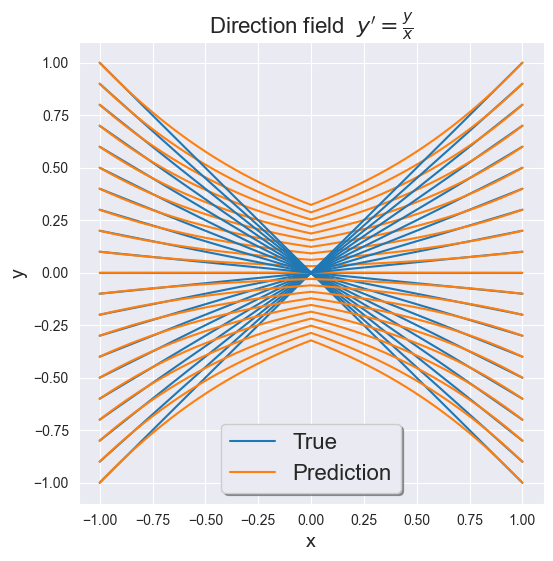

torch.Size([1000, 2001, 1])
Iter 0200 | Total Loss 0.002079


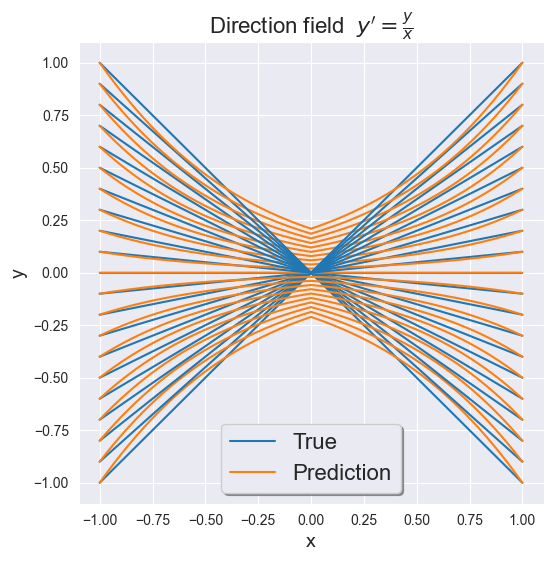

torch.Size([1000, 2001, 1])
Iter 0300 | Total Loss 0.002030


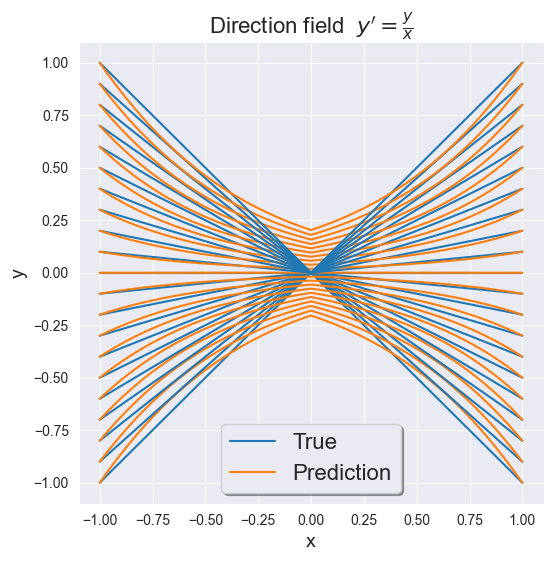

torch.Size([1000, 2001, 1])
Iter 0400 | Total Loss 0.002540


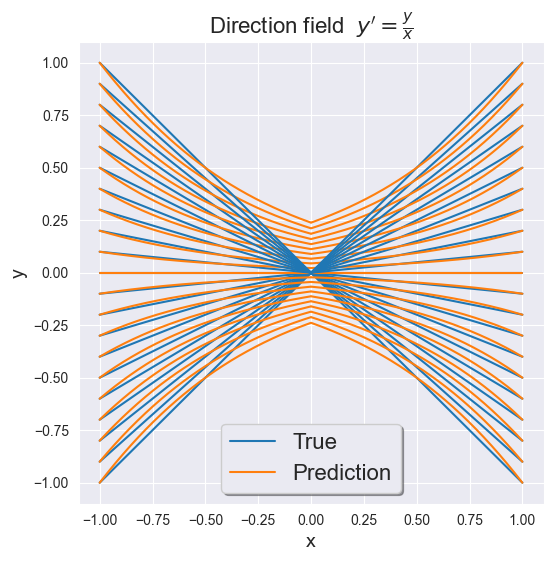

torch.Size([1000, 2001, 1])
Iter 0500 | Total Loss 0.002114


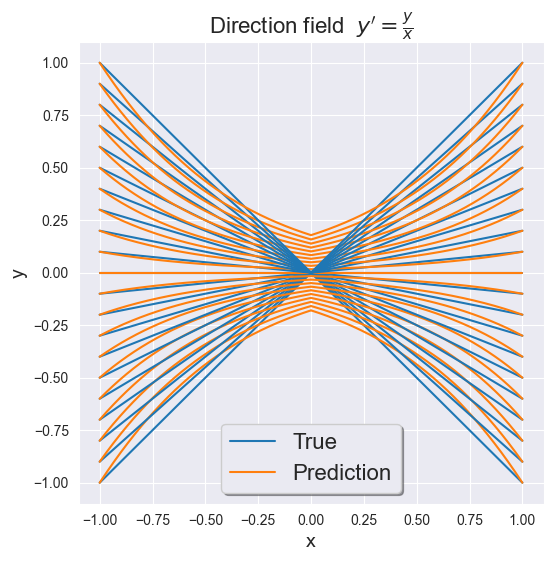

torch.Size([1000, 2001, 1])
Iter 0600 | Total Loss 0.002487


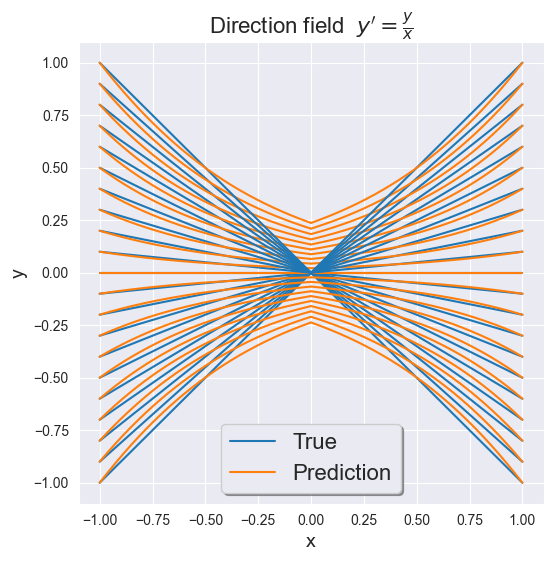

torch.Size([1000, 2001, 1])
Iter 0700 | Total Loss 0.002264


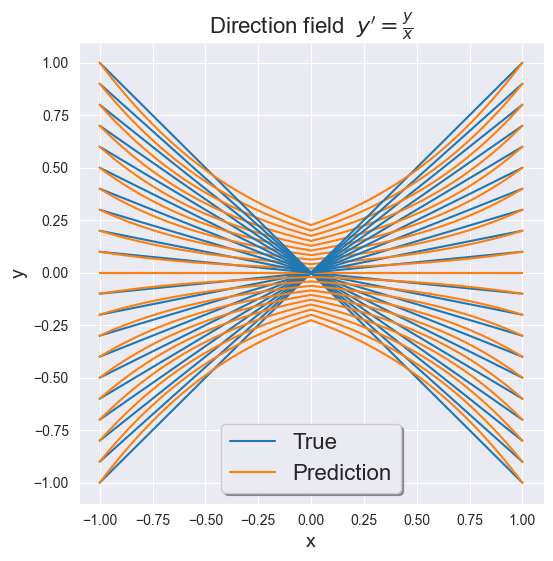

torch.Size([1000, 2001, 1])
Iter 0800 | Total Loss 0.002098


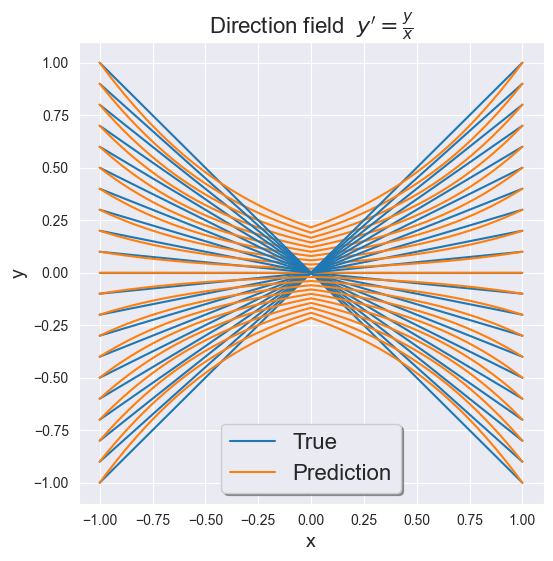

torch.Size([1000, 2001, 1])
Iter 0900 | Total Loss 0.002108


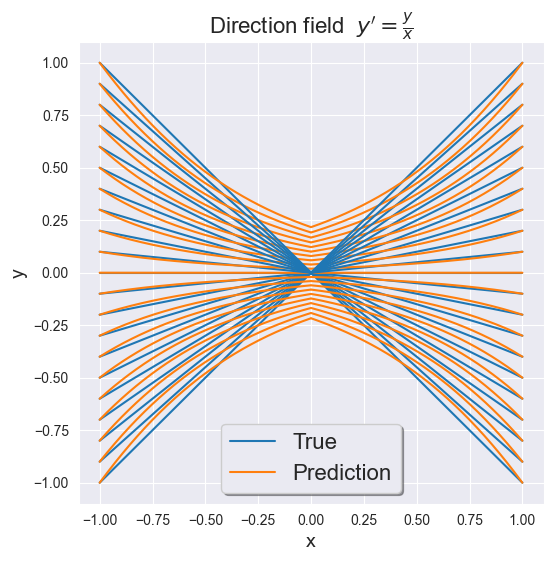

torch.Size([1000, 2001, 1])
Iter 1000 | Total Loss 0.002011


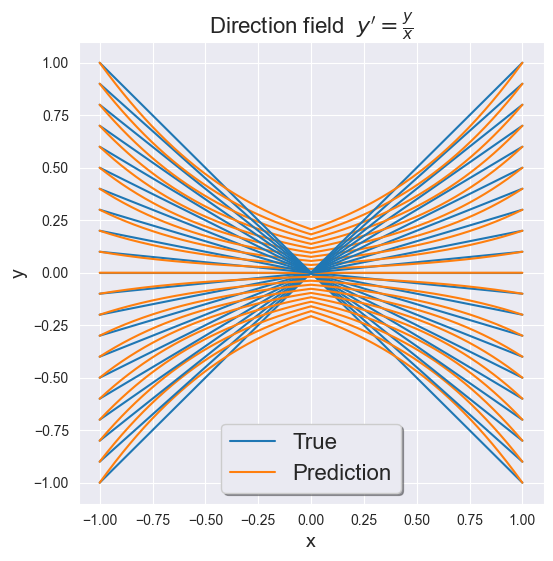

torch.Size([1000, 2001, 1])
Iter 1100 | Total Loss 0.002047


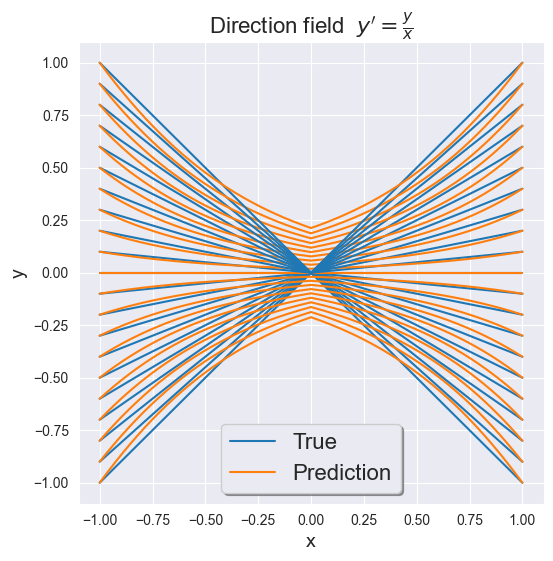

torch.Size([1000, 2001, 1])
Iter 1200 | Total Loss 0.001990


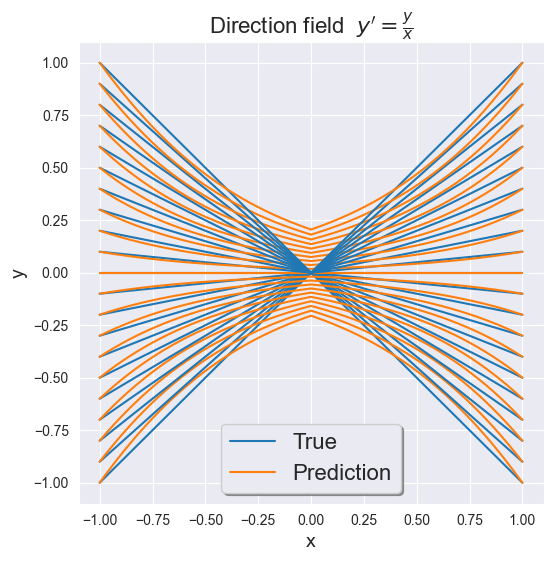

torch.Size([1000, 2001, 1])
Iter 1300 | Total Loss 0.002037


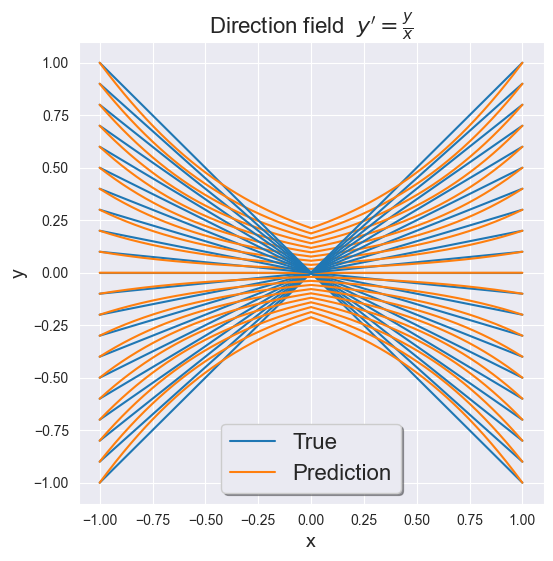

torch.Size([1000, 2001, 1])
Iter 1400 | Total Loss 0.002236


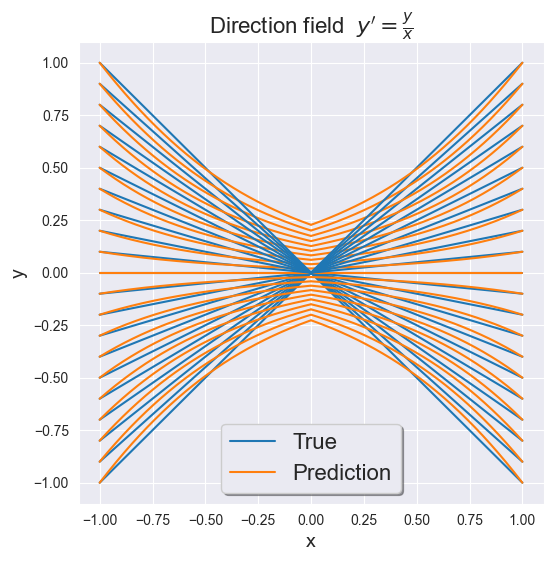

torch.Size([1000, 2001, 1])
Iter 1500 | Total Loss 0.002016


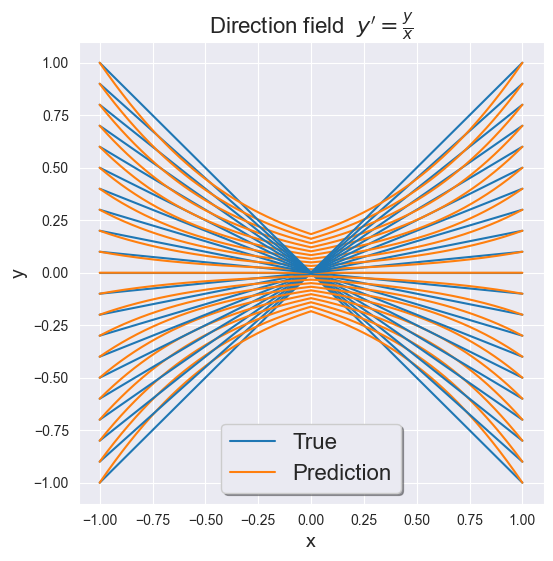

torch.Size([1000, 2001, 1])
Iter 1600 | Total Loss 0.002011


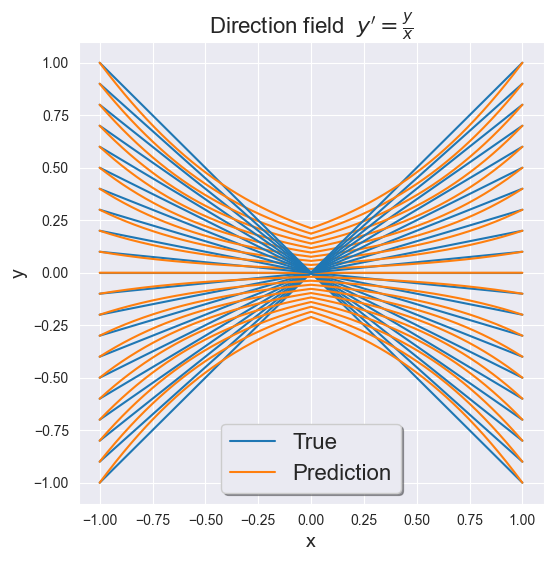

torch.Size([1000, 2001, 1])
Iter 1700 | Total Loss 0.001954


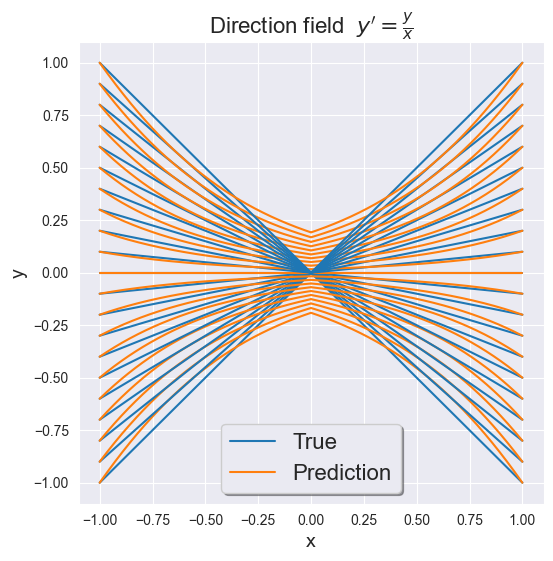

torch.Size([1000, 2001, 1])
Iter 1800 | Total Loss 0.001937


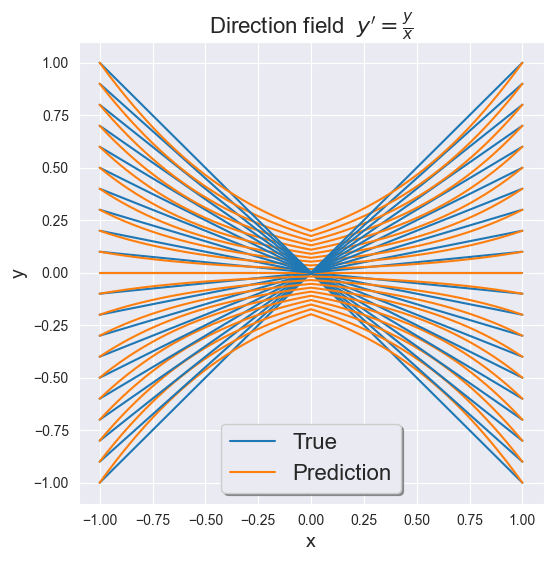

torch.Size([1000, 2001, 1])
Iter 1900 | Total Loss 0.001999


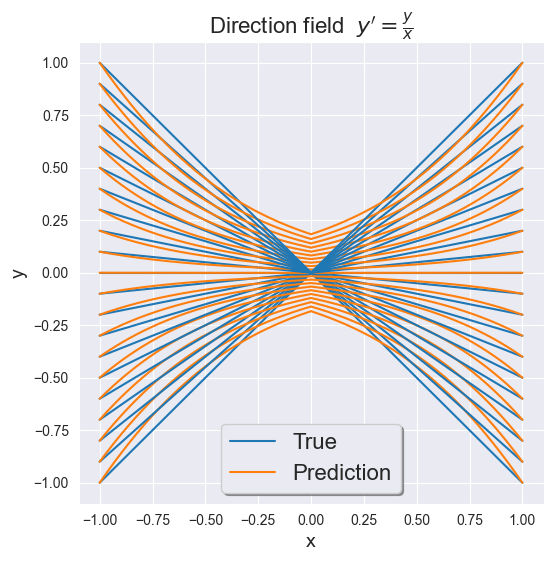

torch.Size([1000, 2001, 1])
Iter 2000 | Total Loss 0.002377


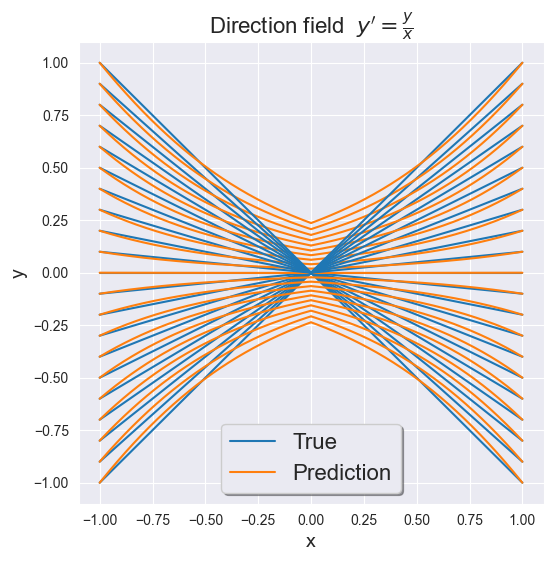

In [116]:
model_uniform = ODE_Net()
niters = 2000
test_freq = 100
batch_time = 100
optimizer_uniform = optim.Adam(model_uniform.parameters(), lr=1e-4, betas=(0.8, 0.9))
train(model_uniform, optimizer_uniform, true_y_uniform_neg, batch_time=batch_time, 
              niters=niters, test_freq=test_freq, name=r"  $y' = \frac{y}{x}$")

  0%|          | 0/4000 [00:00<?, ?it/s]

torch.Size([1000, 2001, 1])
Iter 0100 | Total Loss 539.382568


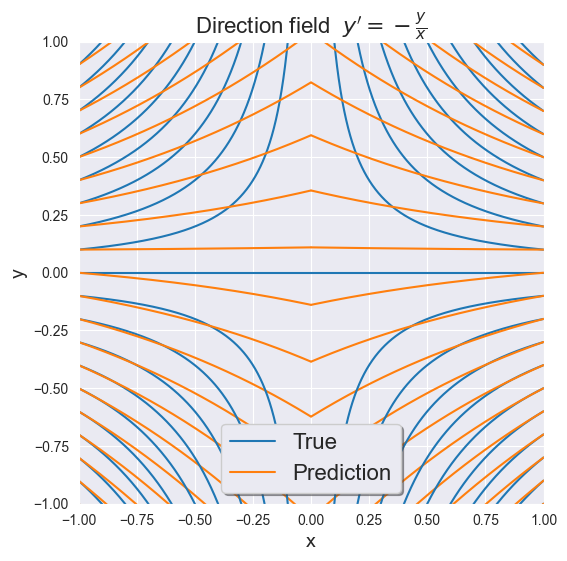

torch.Size([1000, 2001, 1])
Iter 0200 | Total Loss 536.110291


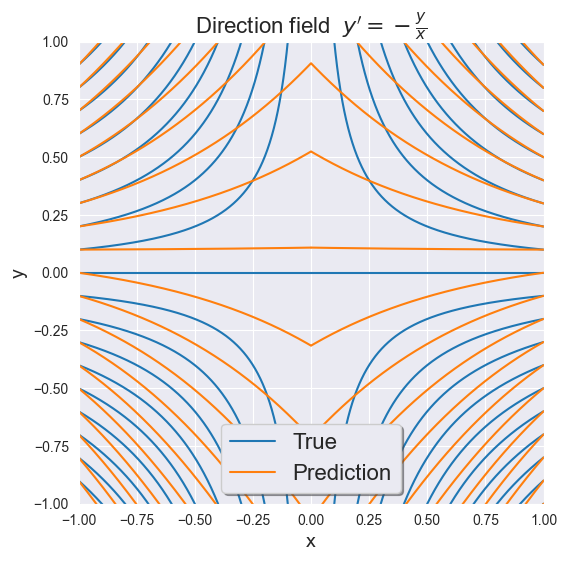

torch.Size([1000, 2001, 1])
Iter 0300 | Total Loss 527.706482


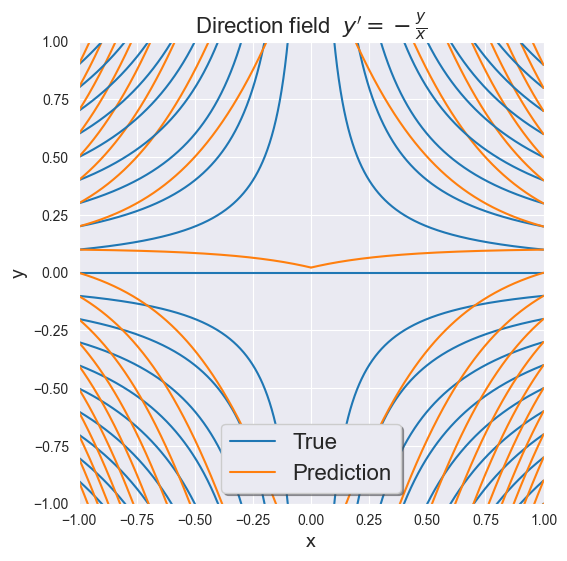

torch.Size([1000, 2001, 1])
Iter 0400 | Total Loss 526.243042


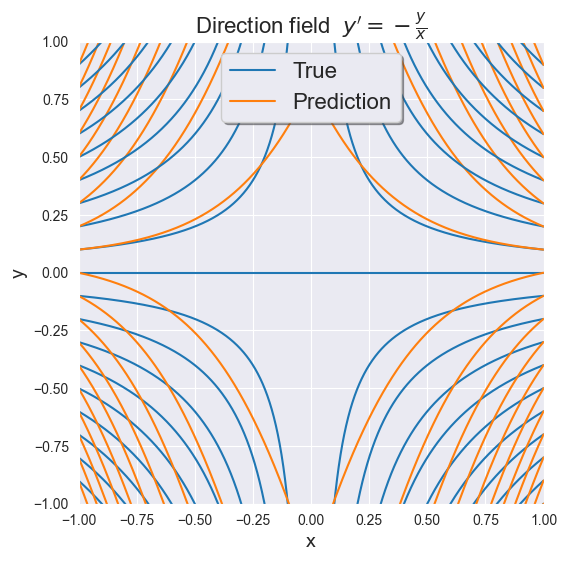

torch.Size([1000, 2001, 1])
Iter 0500 | Total Loss 524.860474


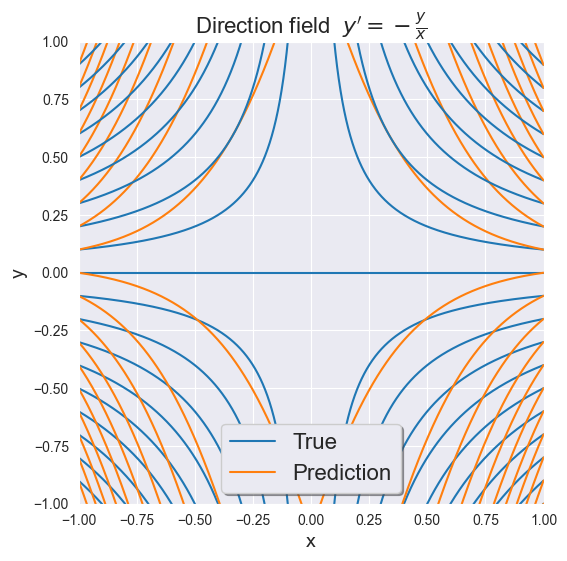

torch.Size([1000, 2001, 1])
Iter 0600 | Total Loss 520.528381


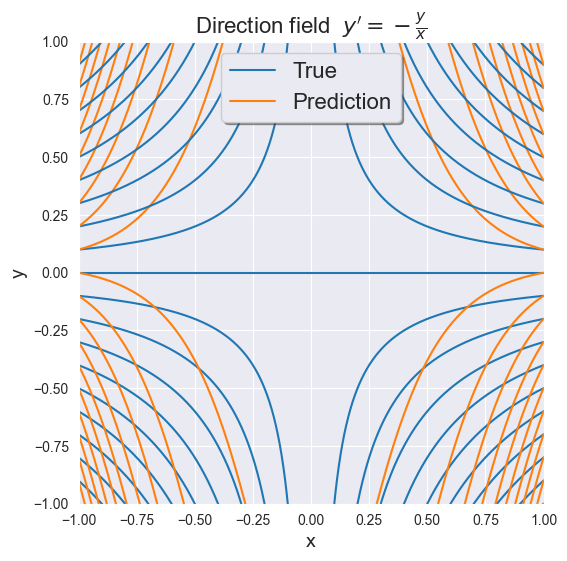

torch.Size([1000, 2001, 1])
Iter 0700 | Total Loss 518.889709


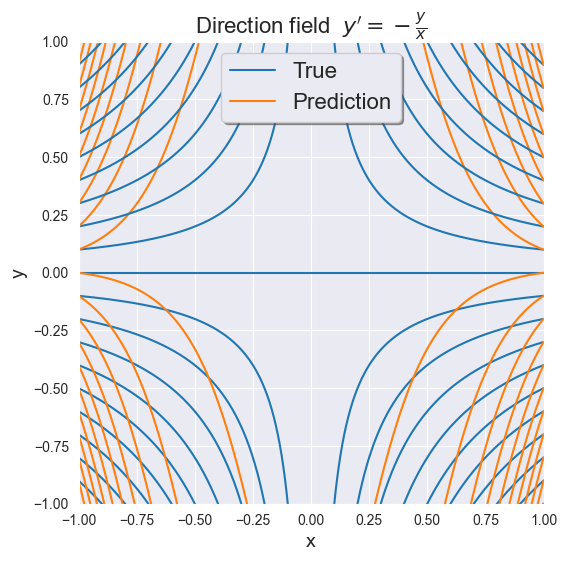

torch.Size([1000, 2001, 1])
Iter 0800 | Total Loss 517.950623


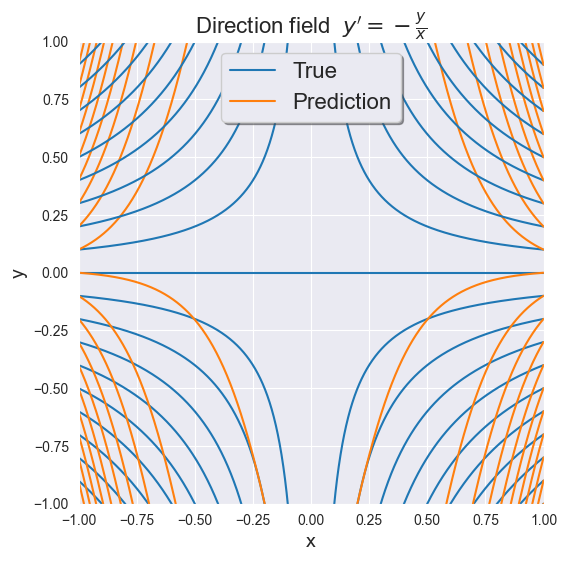

torch.Size([1000, 2001, 1])
Iter 0900 | Total Loss 517.349304


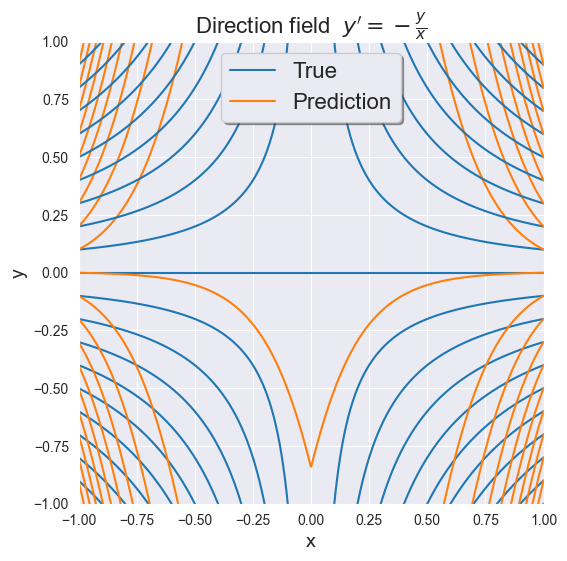

torch.Size([1000, 2001, 1])
Iter 1000 | Total Loss 516.868347


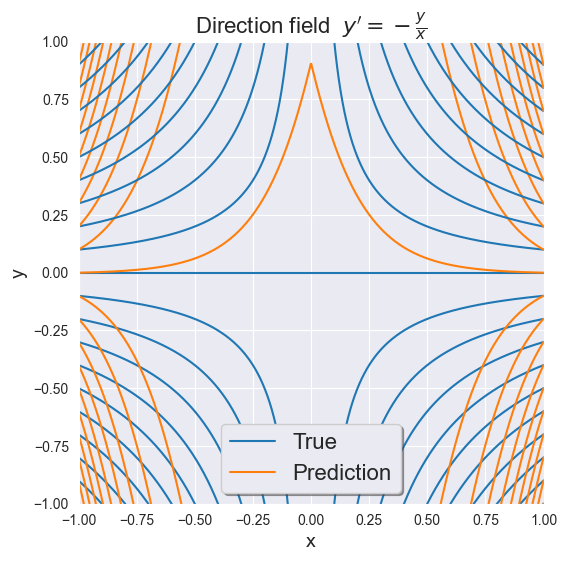

torch.Size([1000, 2001, 1])
Iter 1100 | Total Loss 515.538696


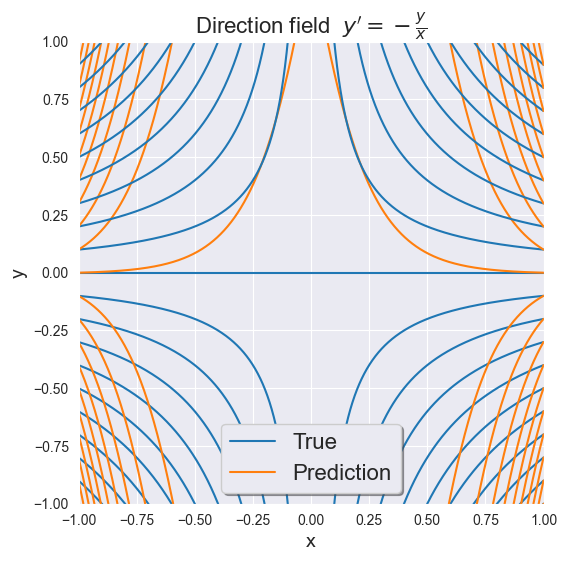

torch.Size([1000, 2001, 1])
Iter 1200 | Total Loss 514.162231


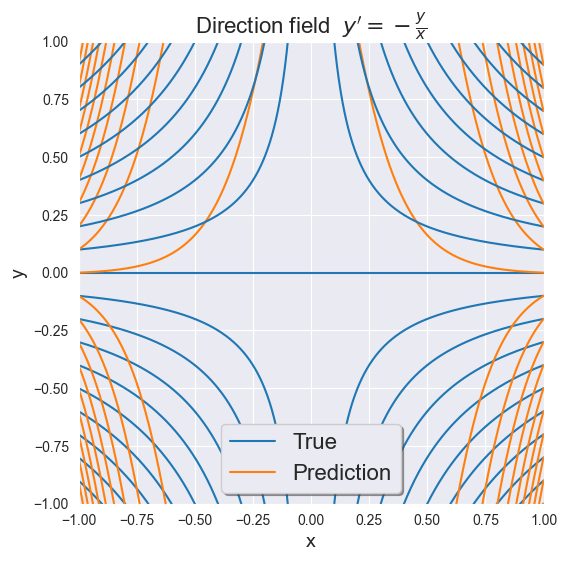

torch.Size([1000, 2001, 1])
Iter 1300 | Total Loss 513.618347


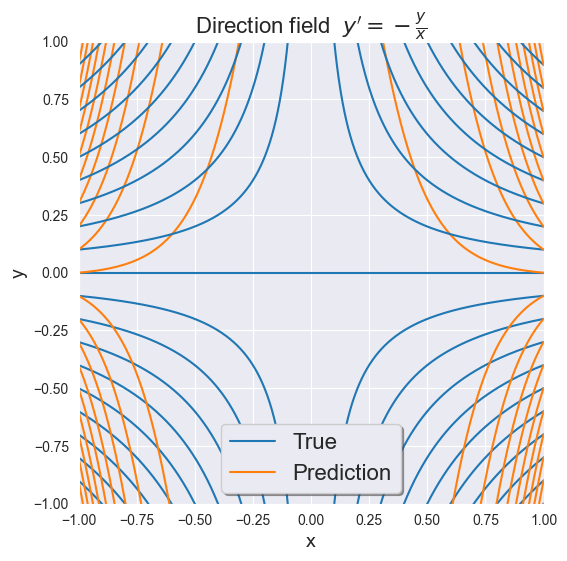

torch.Size([1000, 2001, 1])
Iter 1400 | Total Loss 512.965454


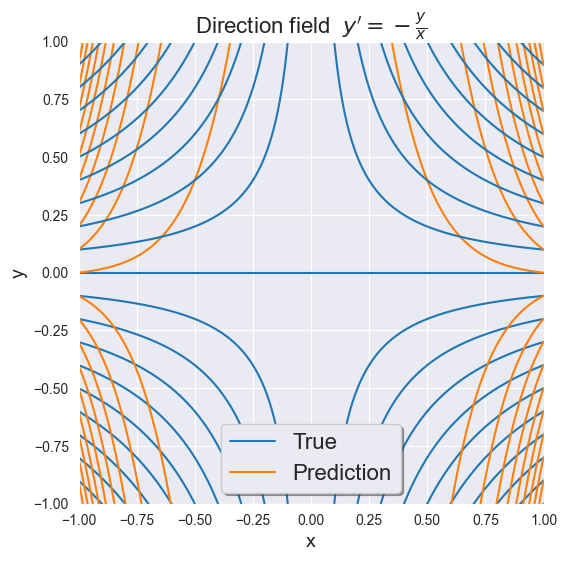

torch.Size([1000, 2001, 1])
Iter 1500 | Total Loss 512.370117


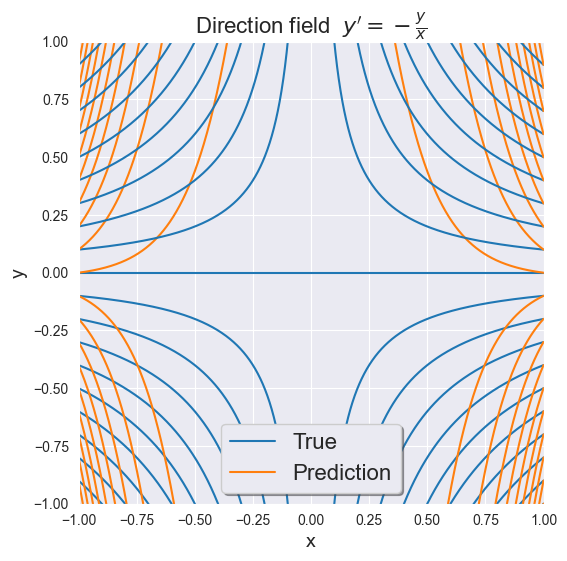

torch.Size([1000, 2001, 1])
Iter 1600 | Total Loss 511.637543


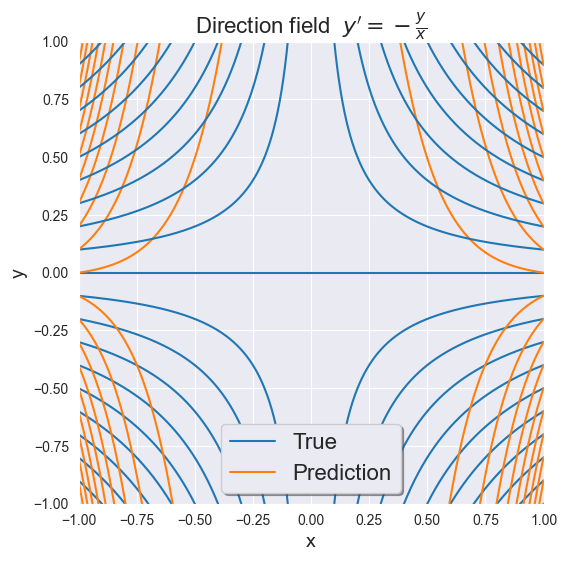

torch.Size([1000, 2001, 1])
Iter 1700 | Total Loss 511.067932


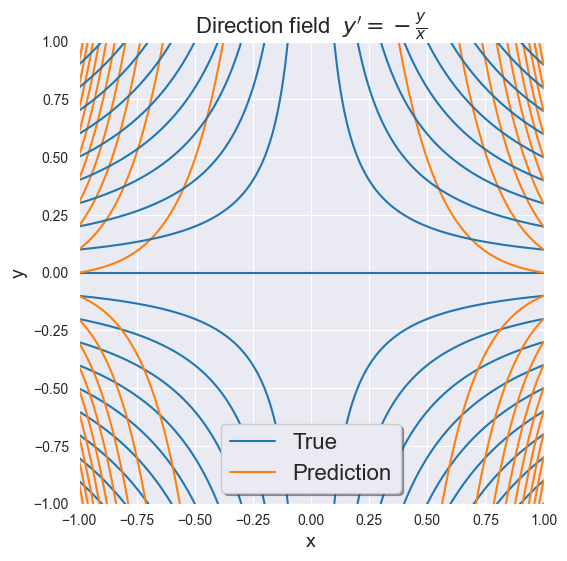

torch.Size([1000, 2001, 1])
Iter 1800 | Total Loss 510.395294


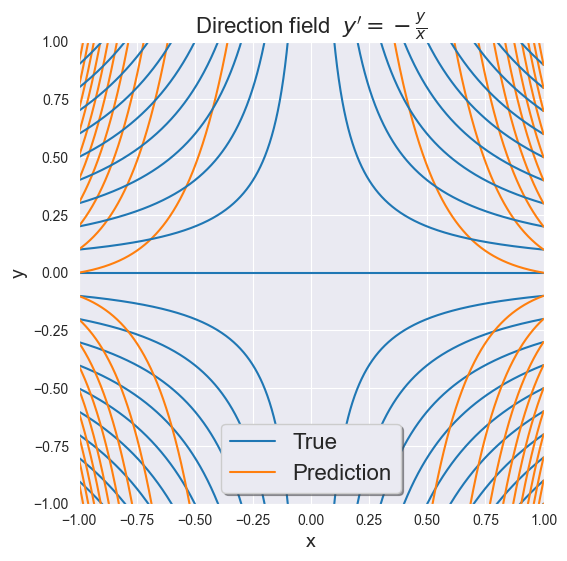

torch.Size([1000, 2001, 1])
Iter 1900 | Total Loss 509.844849


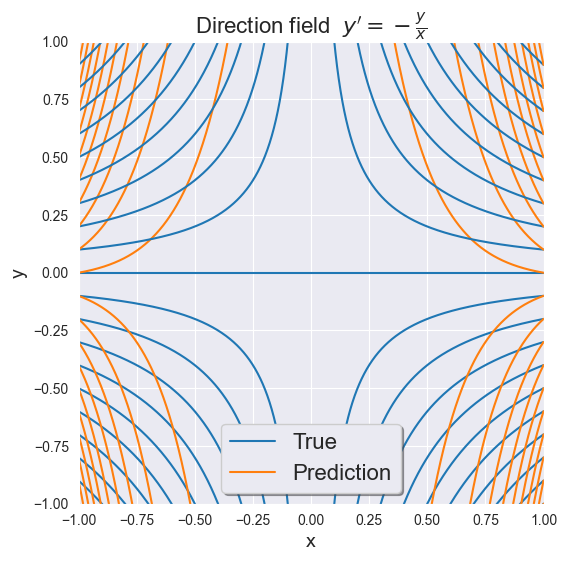

torch.Size([1000, 2001, 1])
Iter 2000 | Total Loss 509.385071


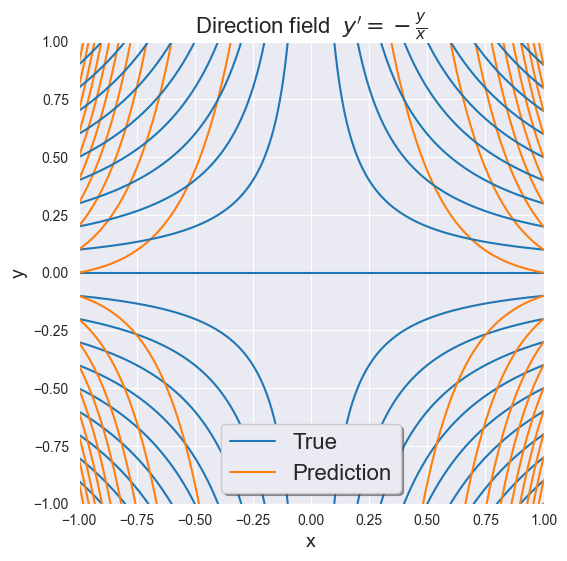

torch.Size([1000, 2001, 1])
Iter 2100 | Total Loss 508.814575


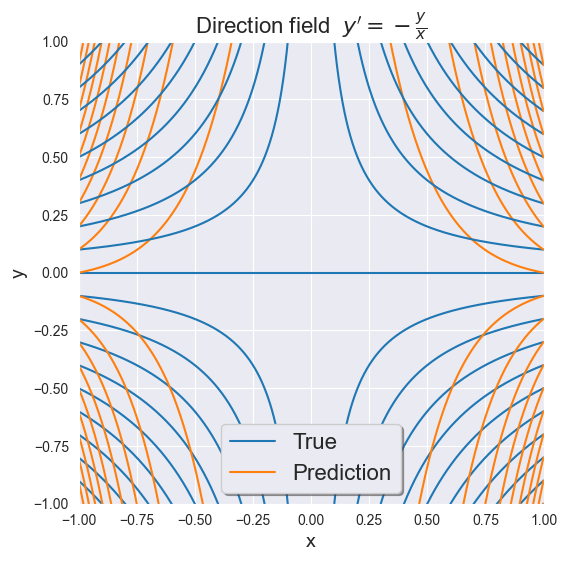

torch.Size([1000, 2001, 1])
Iter 2200 | Total Loss 508.412903


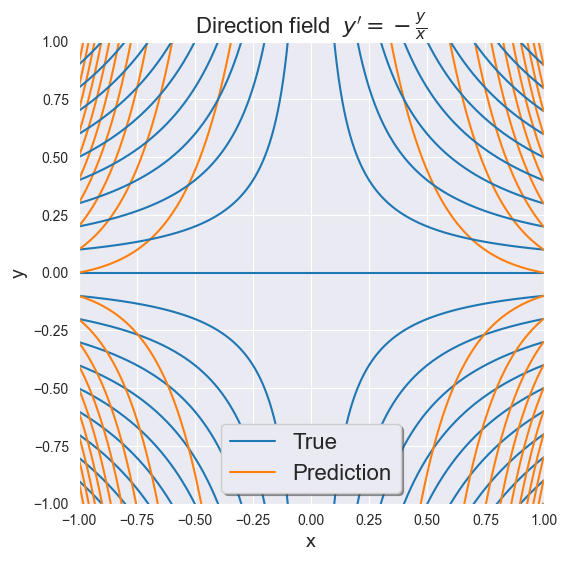

torch.Size([1000, 2001, 1])
Iter 2300 | Total Loss 507.807892


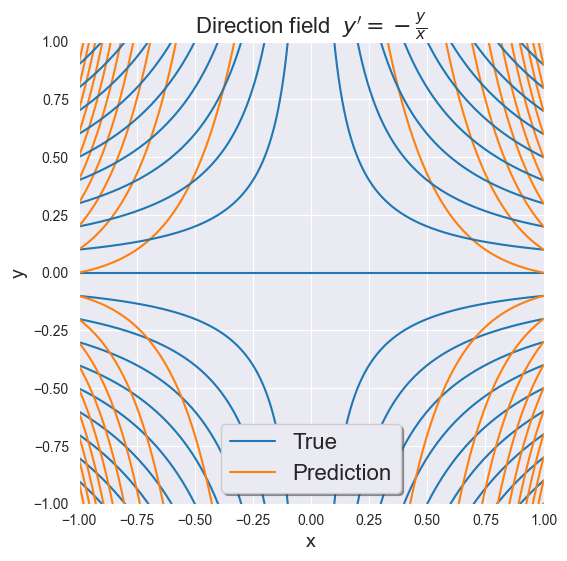

torch.Size([1000, 2001, 1])
Iter 2400 | Total Loss 507.256775


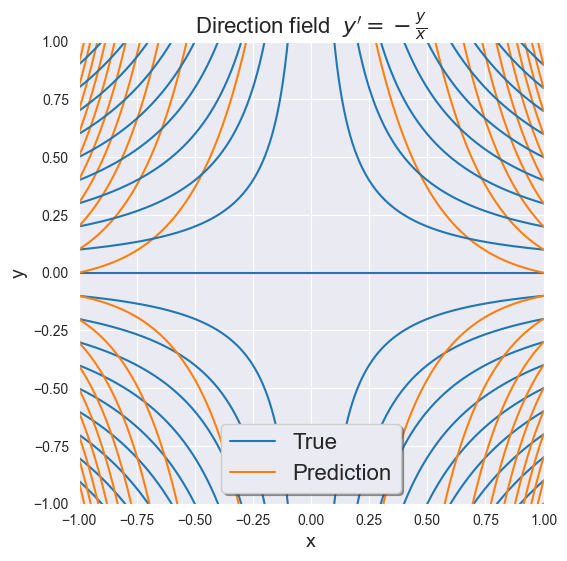

torch.Size([1000, 2001, 1])
Iter 2500 | Total Loss 506.771423


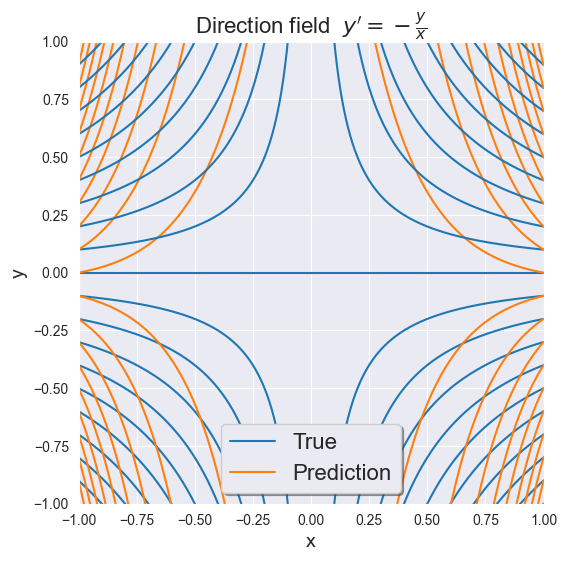

torch.Size([1000, 2001, 1])
Iter 2600 | Total Loss 506.425568


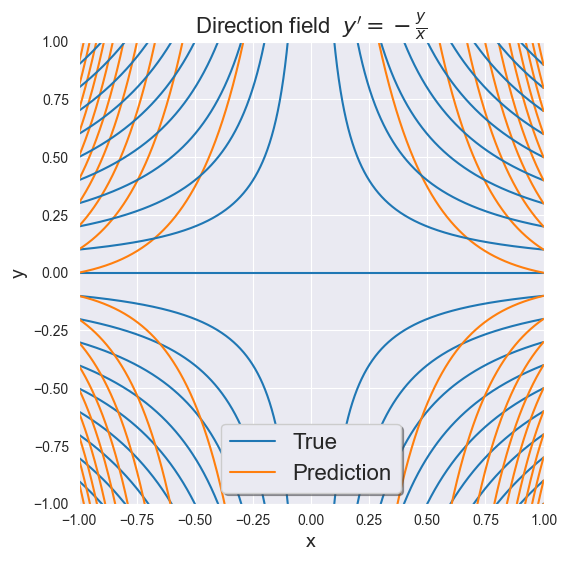

torch.Size([1000, 2001, 1])
Iter 2700 | Total Loss 505.858429


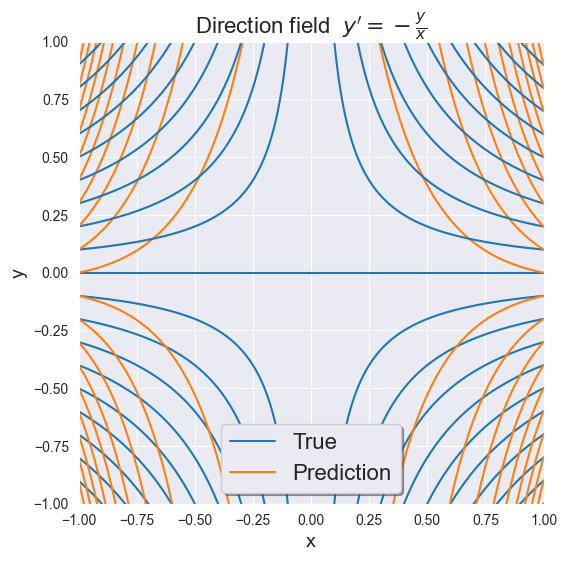

torch.Size([1000, 2001, 1])
Iter 2800 | Total Loss 505.493744


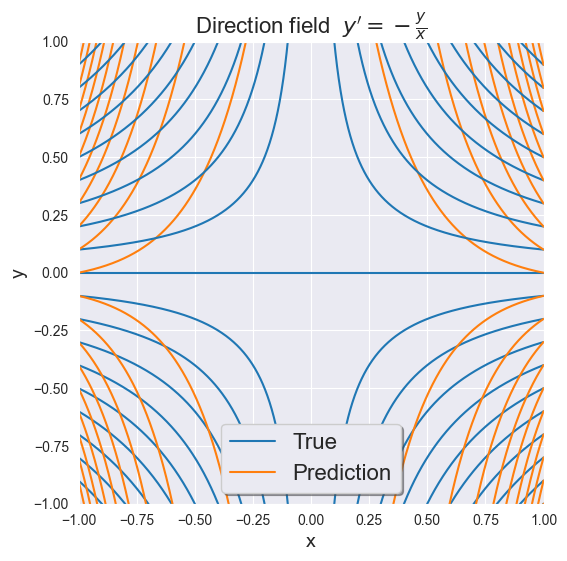

torch.Size([1000, 2001, 1])
Iter 2900 | Total Loss 504.671997


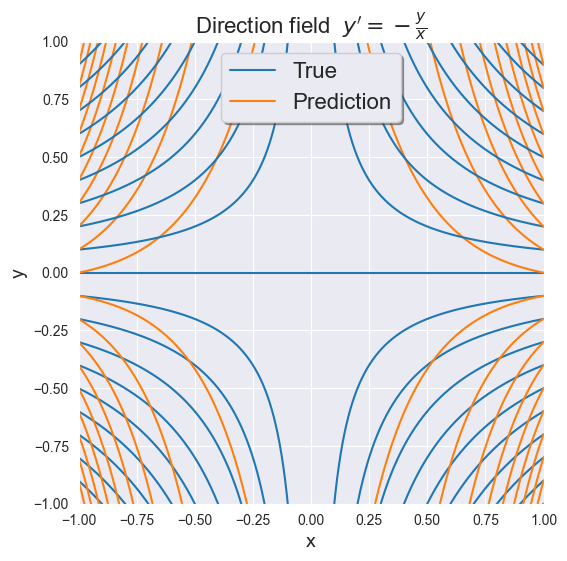

torch.Size([1000, 2001, 1])
Iter 3000 | Total Loss 504.199799


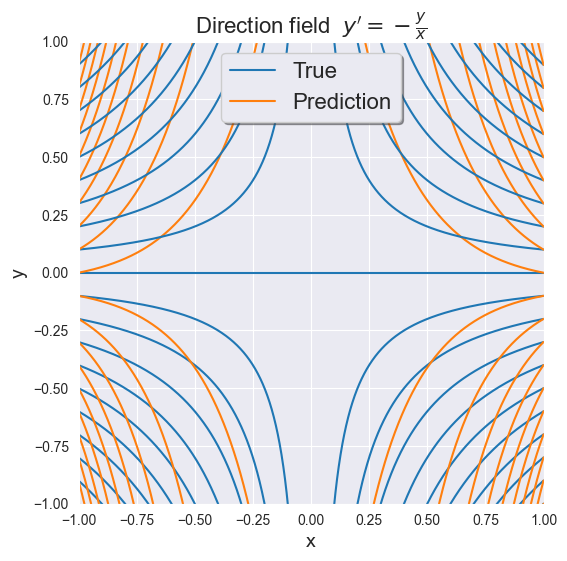

torch.Size([1000, 2001, 1])
Iter 3100 | Total Loss 503.447845


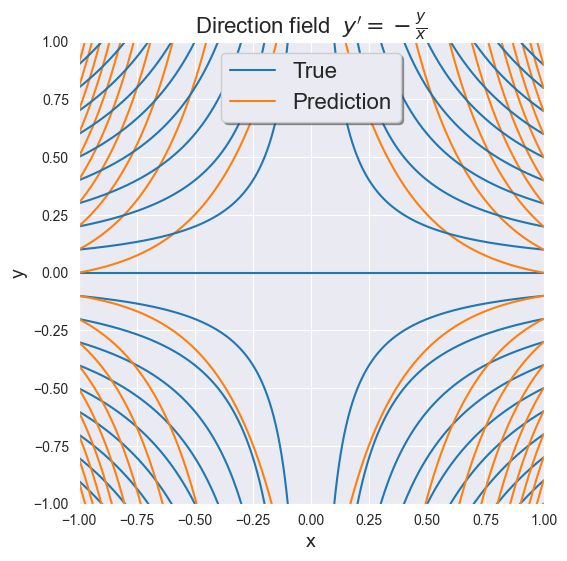

torch.Size([1000, 2001, 1])
Iter 3200 | Total Loss 503.076111


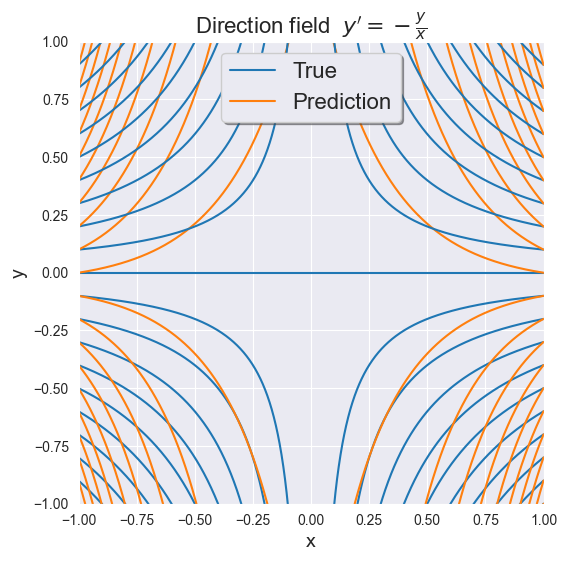

torch.Size([1000, 2001, 1])
Iter 3300 | Total Loss 502.839172


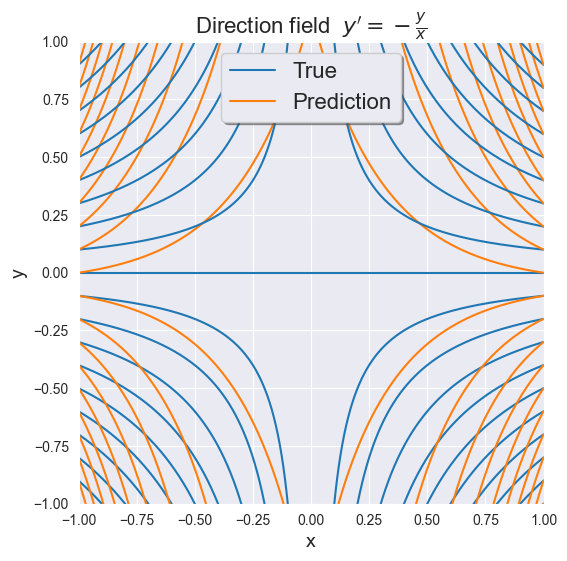

torch.Size([1000, 2001, 1])
Iter 3400 | Total Loss 502.715088


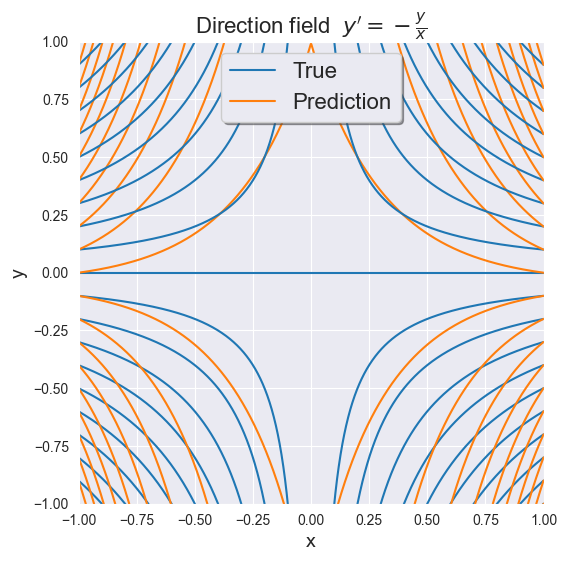

torch.Size([1000, 2001, 1])
Iter 3500 | Total Loss 502.600830


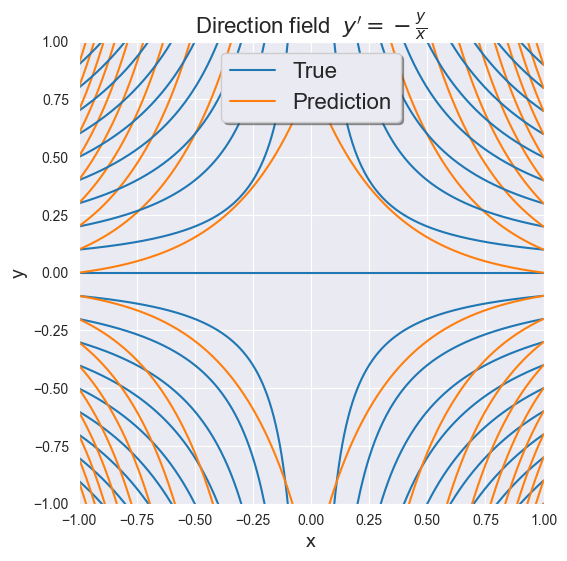

torch.Size([1000, 2001, 1])
Iter 3600 | Total Loss 502.423828


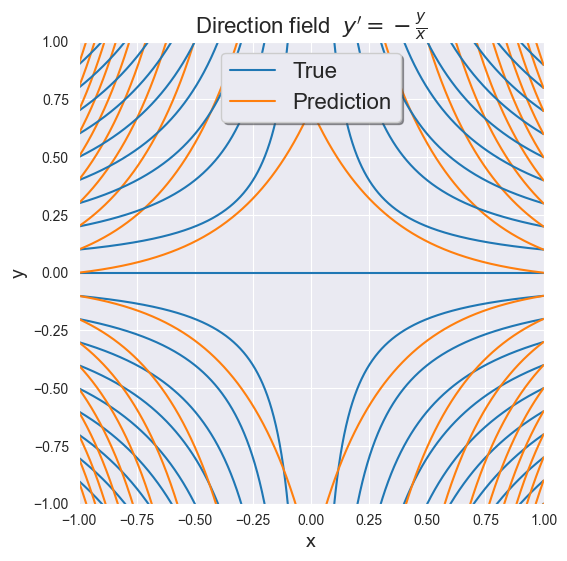

torch.Size([1000, 2001, 1])
Iter 3700 | Total Loss 501.924591


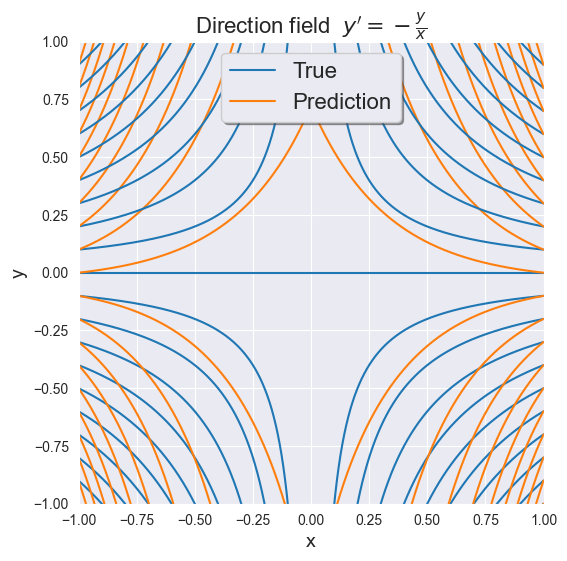

torch.Size([1000, 2001, 1])
Iter 3800 | Total Loss 501.645569


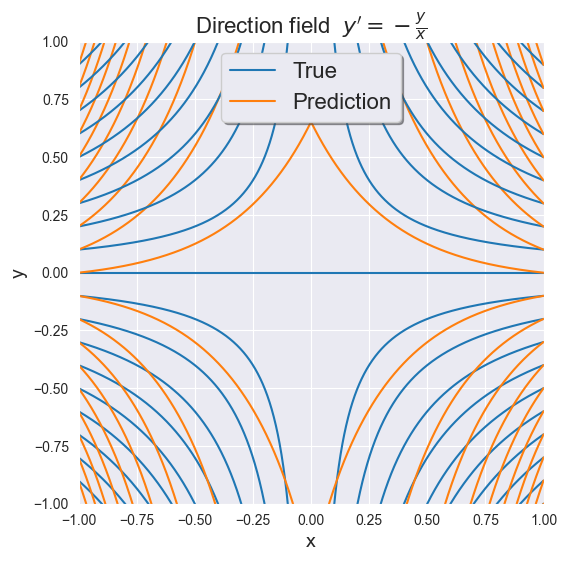

torch.Size([1000, 2001, 1])
Iter 3900 | Total Loss 501.368958


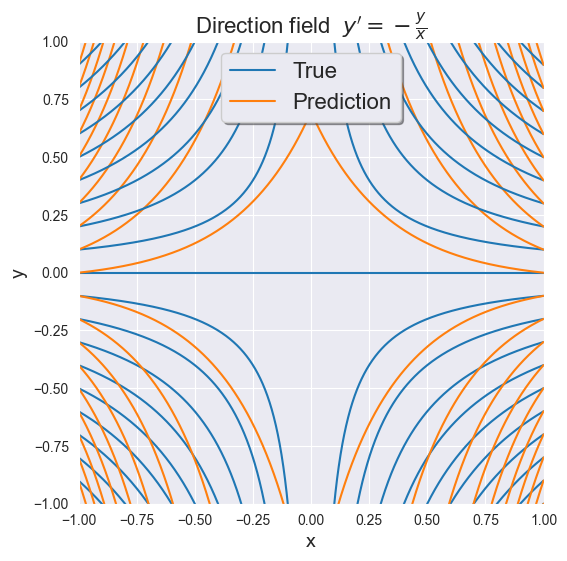

torch.Size([1000, 2001, 1])
Iter 4000 | Total Loss 500.994812


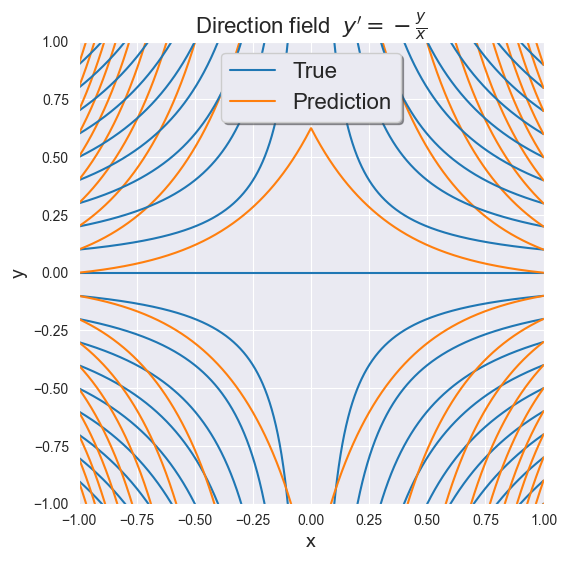

In [123]:
model_saddle = ODE_Net()
niters = 4000
test_freq = 100
batch_time = 100
optimizer_saddle = optim.Adam(model_saddle.parameters(), lr=3e-4)
train(model_saddle, optimizer_saddle, true_y_saddle_neg, batch_time=batch_time, 
              niters=niters, test_freq=test_freq, name=r"  $y' = -\frac{y}{x}$")

In [164]:
class ODE_Net2D(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(2, 64),
            nn.Tanh(),
            nn.Linear(64, 64),
            nn.Tanh(),
            nn.Linear(64, 2))

    def forward(self, t, h):
        return self.net(h)

In [308]:
class Uniform2D(nn.Module): # y' = y / x
    def __init__(self):
        super().__init__()
        self.transition = torch.Tensor([[-1,0], [0,-1]])
    def forward(self, t, h):
        return h @ self.transition


class Saddle2D(nn.Module): # y' = -y / x
    def __init__(self):
        super().__init__()
        self.transition = torch.Tensor([[-1,0], [0,1]])
    def forward(self, t, h):
        return h @ self.transition


class Center(nn.Module): # y' = -x / y
    def __init__(self):
        super().__init__()
        self.transition = torch.Tensor([[0,1], [-1,0]])
    def forward(self, t, h):
        return h @ self.transition


class Spiral(nn.Module): # y' = (x + y) / (x - y)
    def __init__(self):
        super().__init__()
        self.transition = torch.Tensor([[-1,1], [-1,-1]])
    def forward(self, t, h):
        return h @ self.transition


In [187]:
def get_data2D(true_h, t, batch_time=64):
    index_range = np.arange(1000)
    t0 = np.random.choice(index_range[:-batch_time])
    idx_neg = torch.tensor(np.array([t0 + i for i in range(batch_time)]))
    batch_h = true_h[idx_neg]
   
    return batch_h[0], t[idx_neg], batch_h


def visualize2D(true_h, pred_h, name=""):
    plt.figure(figsize=(6, 6))
    for i in range(0, true_h.shape[1], 100):
        plt.plot(true_h[:,i,0].numpy(), true_h[:,i,1].numpy(), color=sns.color_palette()[0])
        plt.plot(pred_h[:,i,0].numpy(), pred_h[:,i,1].numpy(), color=sns.color_palette()[1])
    plt.xlabel('x', fontsize=14)
    plt.ylabel('y', fontsize=14)
    plt.xlim(left=-1.1, right=1.1)
    plt.ylim(bottom=-1.1, top=1.1)
    plt.title('Direction field' + name, fontsize=16)
    plt.legend(['True', 'Prediction'], shadow=True, fontsize=16)
    plt.show()


def train2D(model, optimizer, h_true, h0s, t, batch_time=32, niters=500, test_freq=50, name=""):
    for itr in tqdm(range(1, niters + 1)):
        optimizer.zero_grad()
        batch_h0, batch_t, batch_h = get_data2D(h_true, t, batch_time=32)
        pred_h = odeint(model, batch_h0, batch_t)
        loss = torch.mean(F.mse_loss(pred_h, batch_h))
        loss.backward()
        optimizer.step()
    
        if itr % test_freq == 0:
            with torch.no_grad():
                h_pred = odeint(model, h0s, t)
                loss = torch.mean(F.mse_loss(h_pred, h_true))
                print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
                visualize2D(h_true, h_pred.detach().cpu(), name=name)

In [188]:
t_center = torch.linspace(0, 25, 1000)

r0s_center = torch.Tensor(np.arange(-1, 1.001, 0.001).reshape(-1,1))
phis_center = torch.rand(r0s_center.shape) * np.pi * 2

x0s_center = r0s_center * torch.cos(phis_center)
y0s_center = r0s_center * torch.sin(phis_center)

h0s_center = torch.cat([x0s_center, y0s_center], dim=-1)

true_h_center = odeint(Center(), h0s_center, t_center)

  0%|          | 0/500 [00:00<?, ?it/s]

Iter 0050 | Total Loss 0.061649


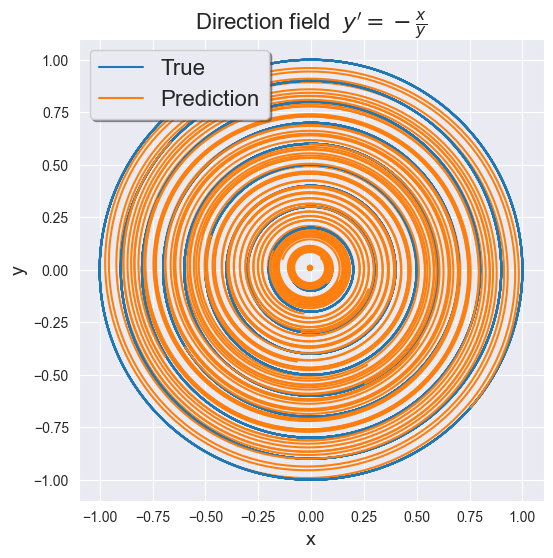

Iter 0100 | Total Loss 0.025522


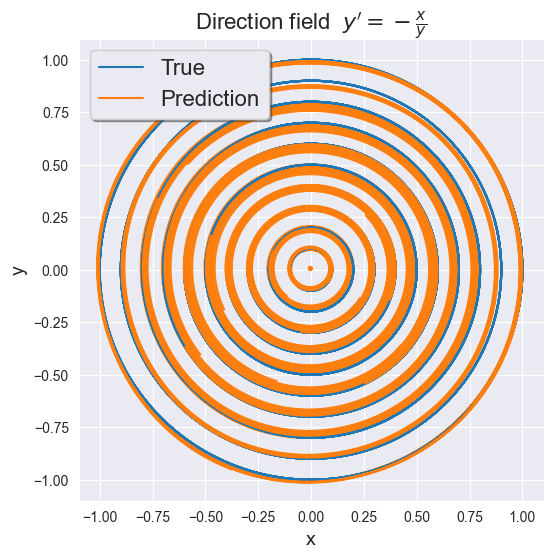

Iter 0150 | Total Loss 0.025509


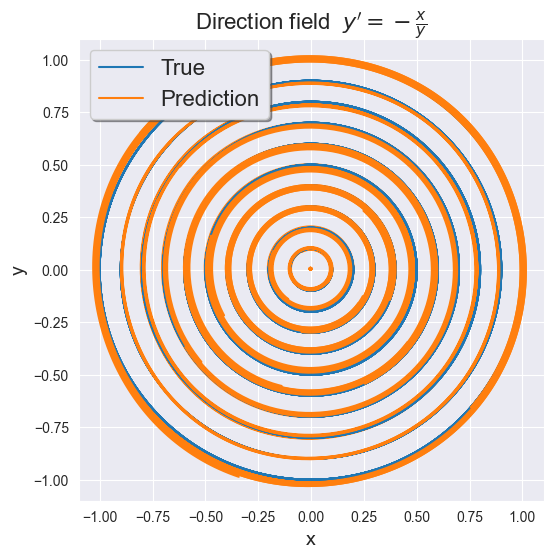

Iter 0200 | Total Loss 0.024206


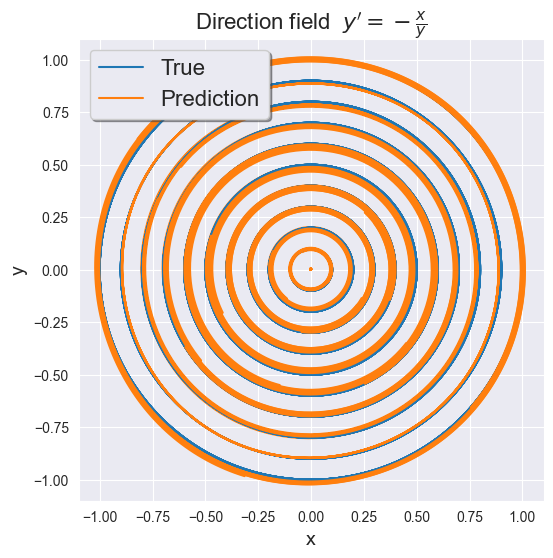

Iter 0250 | Total Loss 0.023580


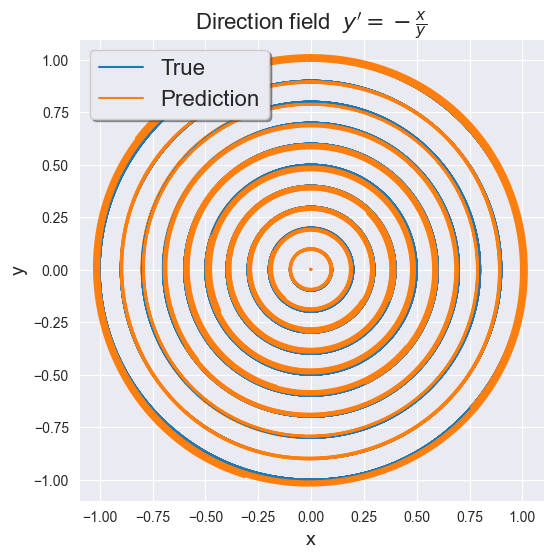

Iter 0300 | Total Loss 0.022221


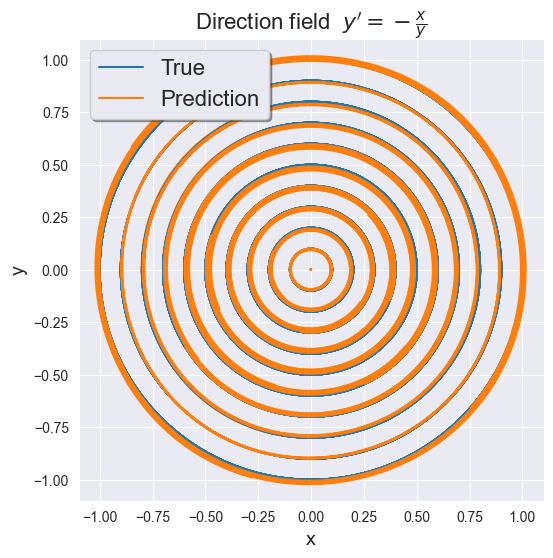

Iter 0350 | Total Loss 0.021346


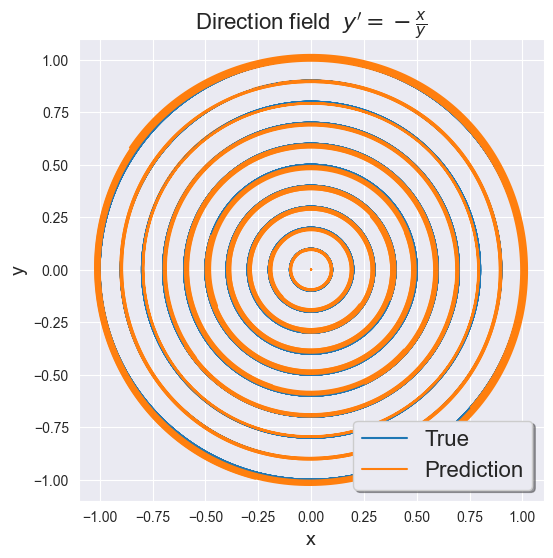

Iter 0400 | Total Loss 0.019588


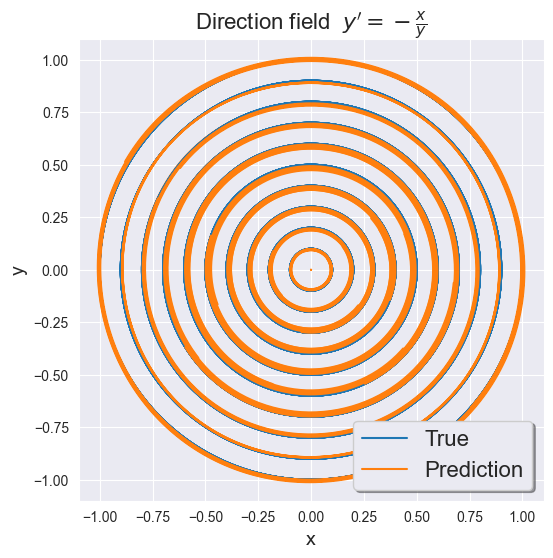

Iter 0450 | Total Loss 0.018850


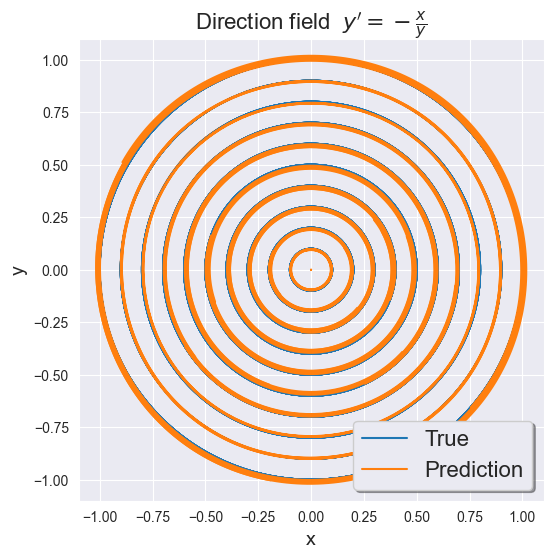

Iter 0500 | Total Loss 0.017374


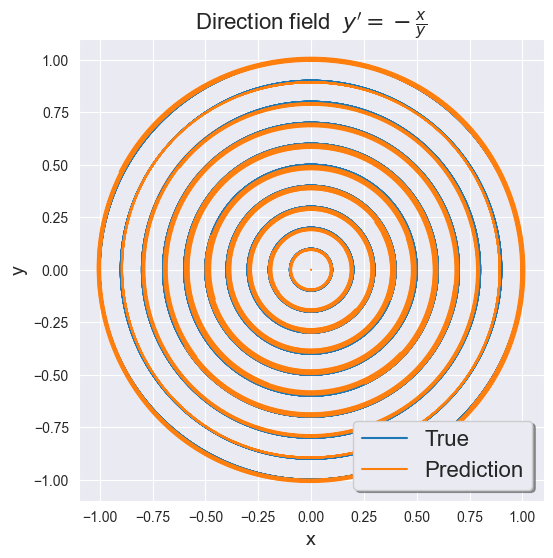

In [178]:
model_center = ODE_Net2D()
niters = 500
test_freq = 50
batch_time = 100
optimizer_center = optim.Adam(model_center.parameters(), lr=1e-3)
train2D(model_center, optimizer_center, true_h_center, h0s_center, t_center, batch_time=batch_time, 
              niters=niters, test_freq=test_freq, name=r"  $y' = -\frac{x}{y}$")

In [213]:
t_spiral = torch.linspace(0, 25, 1000)

x0s_spiral = torch.cat([torch.Tensor(np.arange(-1, 1.004, 0.004).reshape(-1,1)),
                        torch.ones(np.arange(-1, 1.004, 0.004).reshape(-1,1).shape).reshape(-1,1),
                        -torch.Tensor(np.arange(-1, 1.004, 0.004).reshape(-1,1)),
                        -torch.ones(np.arange(-1, 1.004, 0.004).reshape(-1,1).shape).reshape(-1,1)
                       ], dim=0)
y0s_spiral = torch.cat([-torch.ones(np.arange(-1, 1.004, 0.004).reshape(-1,1).shape).reshape(-1,1),
                        torch.Tensor(np.arange(-1, 1.004, 0.004).reshape(-1,1)),
                        torch.ones(np.arange(-1, 1.004, 0.004).reshape(-1,1).shape).reshape(-1,1),
                        -torch.Tensor(np.arange(-1, 1.004, 0.004).reshape(-1,1))
                       ], dim=0)

h0s_spiral = torch.cat([x0s_spiral, y0s_spiral], dim=-1)

true_h_spiral = odeint(Spiral(), h0s_spiral, t_spiral)

  0%|          | 0/1000 [00:00<?, ?it/s]

Iter 0100 | Total Loss 0.049566


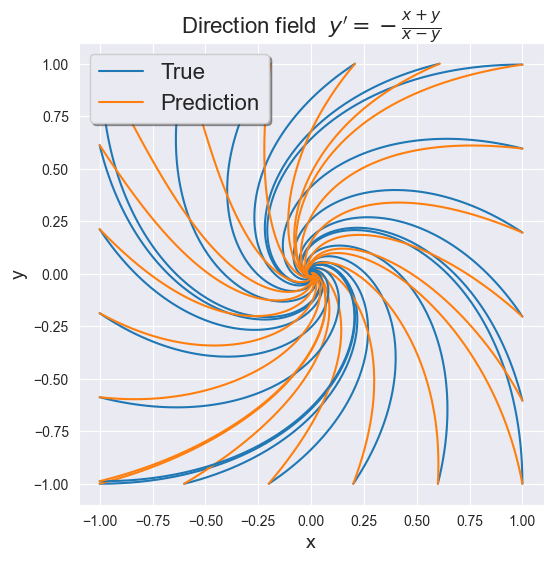

Iter 0200 | Total Loss 0.006770


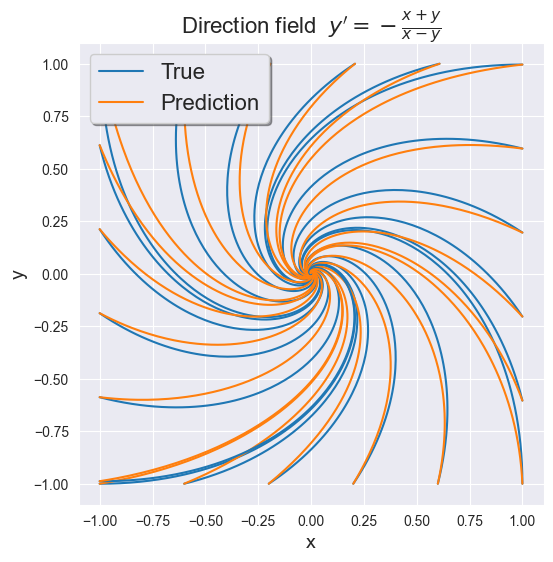

Iter 0300 | Total Loss 0.002206


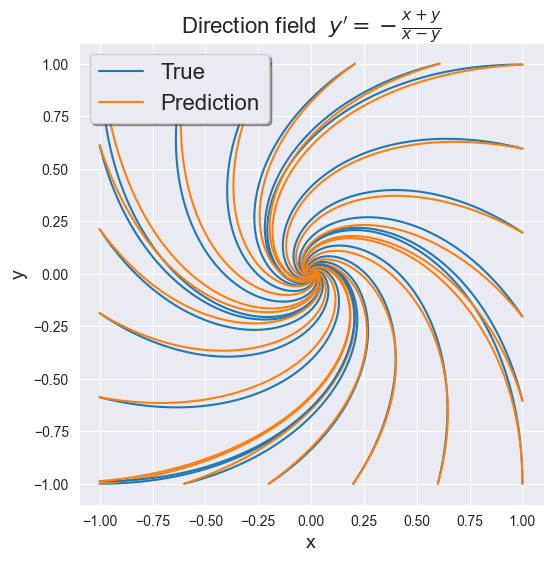

Iter 0400 | Total Loss 0.001130


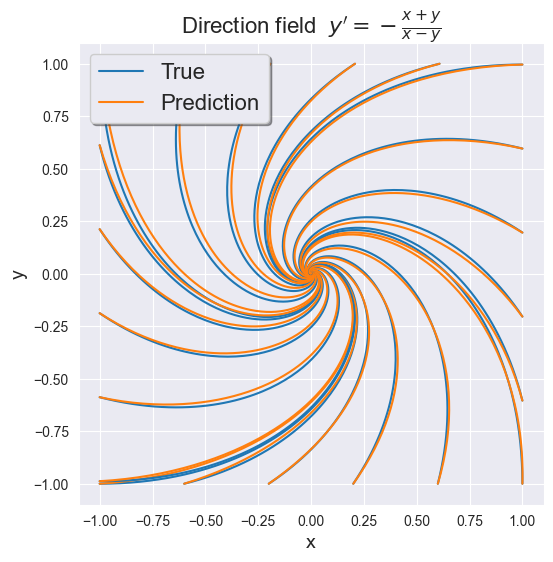

Iter 0500 | Total Loss 0.000519


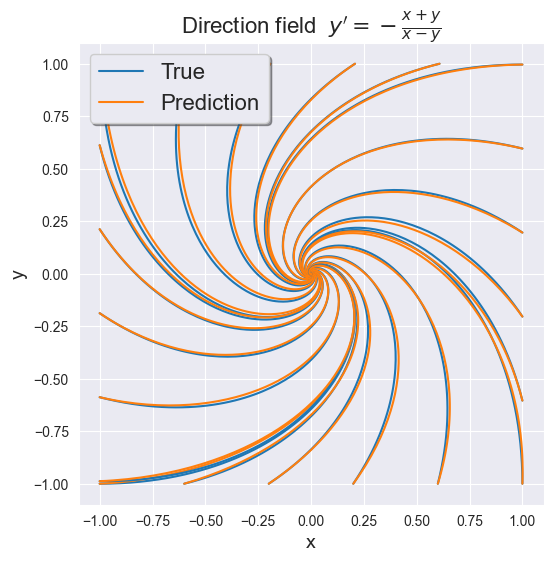

Iter 0600 | Total Loss 0.000095


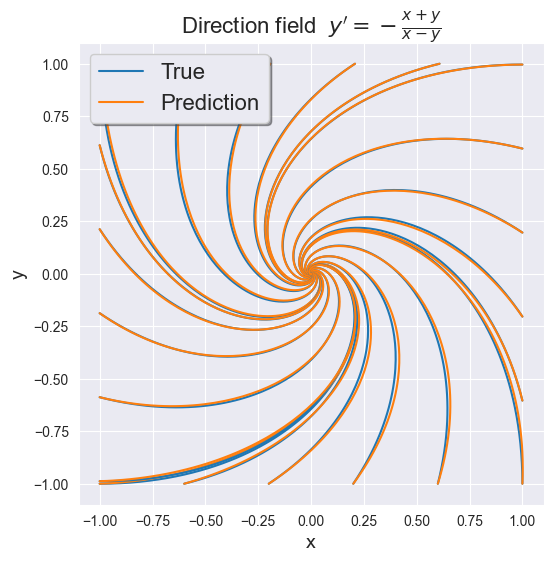

Iter 0700 | Total Loss 0.000041


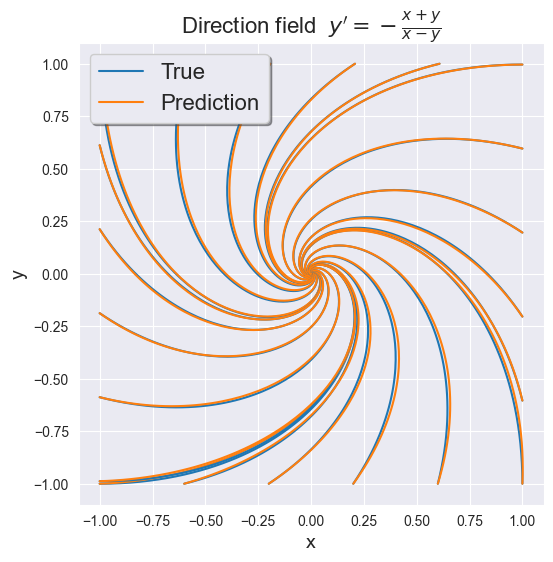

Iter 0800 | Total Loss 0.000039


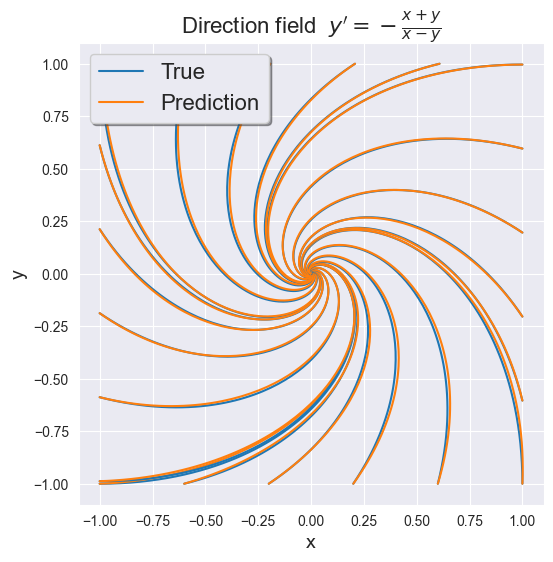

Iter 0900 | Total Loss 0.000027


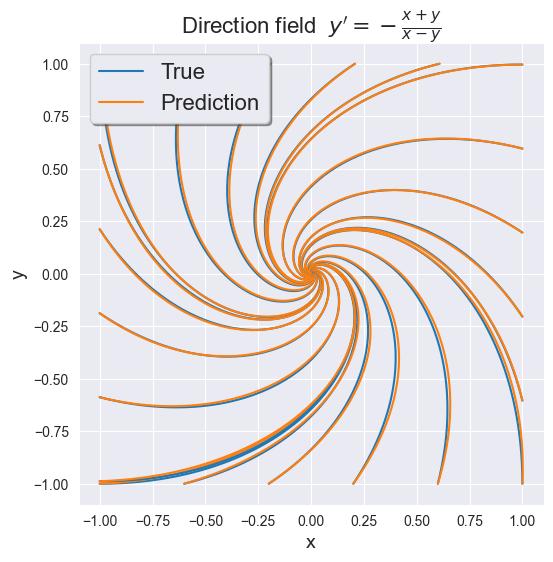

Iter 1000 | Total Loss 0.000020


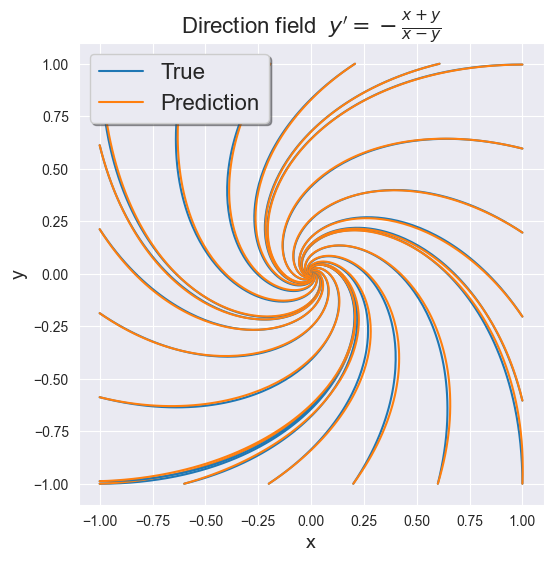

In [217]:
model_spiral = ODE_Net2D()
niters = 1000
test_freq = 100
batch_time = 100
optimizer_spiral = optim.Adam(model_spiral.parameters(), lr=3e-4)
train2D(model_spiral, optimizer_spiral, true_h_spiral, h0s_spiral, t_spiral, batch_time=batch_time, 
              niters=niters, test_freq=test_freq, name=r"  $y' = \frac{x+y}{x-y}$")

In [280]:
t_uniform = torch.linspace(0, 25, 1000)

x0s_uniform = torch.cat([torch.Tensor(np.arange(-1, 1.004, 0.004).reshape(-1,1)),
                        torch.ones(np.arange(-1, 1.004, 0.004).reshape(-1,1).shape).reshape(-1,1),
                        -torch.Tensor(np.arange(-1, 1.004, 0.004).reshape(-1,1)),
                        -torch.ones(np.arange(-1, 1.004, 0.004).reshape(-1,1).shape).reshape(-1,1)
                       ], dim=0)
y0s_uniform = torch.cat([-torch.ones(np.arange(-1, 1.004, 0.004).reshape(-1,1).shape).reshape(-1,1),
                        torch.Tensor(np.arange(-1, 1.004, 0.004).reshape(-1,1)),
                        torch.ones(np.arange(-1, 1.004, 0.004).reshape(-1,1).shape).reshape(-1,1),
                        -torch.Tensor(np.arange(-1, 1.004, 0.004).reshape(-1,1))
                       ], dim=0)

h0s_uniform = torch.cat([x0s_uniform, y0s_uniform], dim=-1)

true_h_uniform = odeint(Uniform2D(), h0s_uniform, t_uniform)

  0%|          | 0/1000 [00:00<?, ?it/s]

Iter 0100 | Total Loss 0.001794


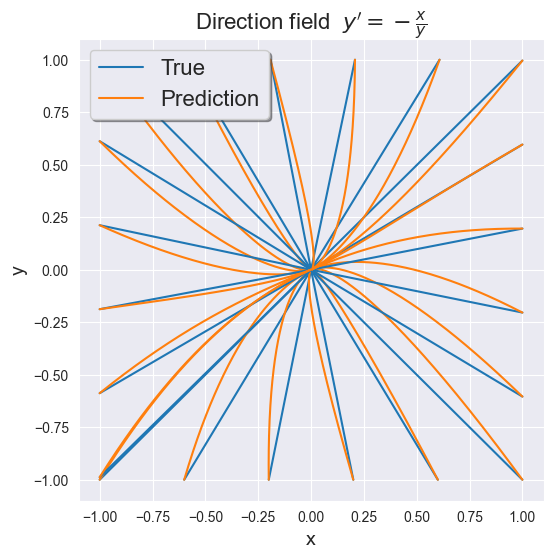

Iter 0200 | Total Loss 0.000016


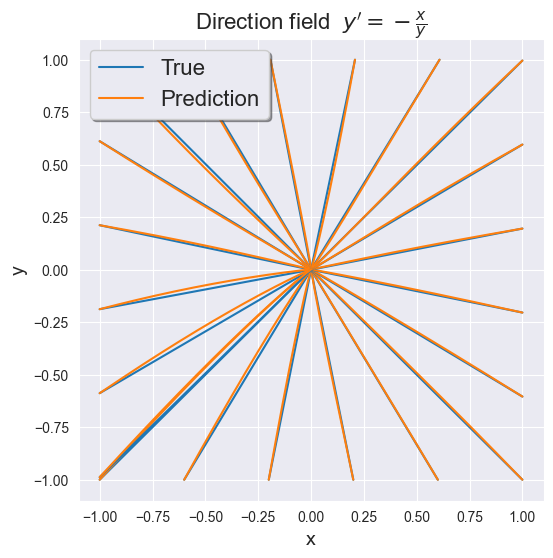

Iter 0300 | Total Loss 0.000019


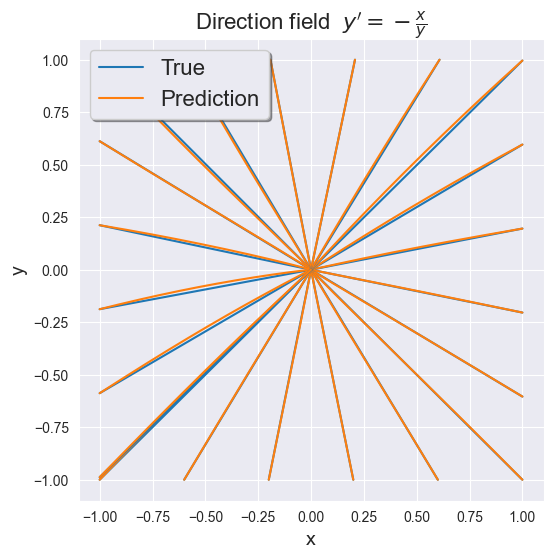


KeyboardInterrupt



In [281]:
model_uniform = ODE_Net2D()
niters = 400
test_freq = 100
batch_time = 100
optimizer_uniform = optim.Adam(model_uniform.parameters(), lr=3e-4)
train2D(model_uniform, optimizer_uniform, true_h_uniform, h0s_uniform, t_uniform, batch_time=batch_time, 
              niters=niters, test_freq=test_freq, name=r"  $y' = -\frac{x}{y}$")

In [303]:
t_saddle = torch.linspace(0, 5, 1000)

x0s_saddle = torch.cat([-torch.ones(np.arange(-1.001, 1.001, 0.002).reshape(-1,1).shape).reshape(-1,1),
                        torch.ones(np.arange(-1.001, 1.001, 0.002).reshape(-1,1).shape).reshape(-1,1),
                       ], dim=0)
y0s_saddle = torch.cat([torch.Tensor(np.arange(-1.001, 1.001, 0.002).reshape(-1,1)),
                        -torch.Tensor(np.arange(-1.001, 1.001, 0.002).reshape(-1,1)),
                       ], dim=0)


h0s_saddle = torch.cat([x0s_saddle, y0s_saddle], dim=-1)

true_h_saddle = odeint(Saddle2D(), h0s_saddle, t_saddle)

  0%|          | 0/1000 [00:00<?, ?it/s]

Iter 0100 | Total Loss 143.205231


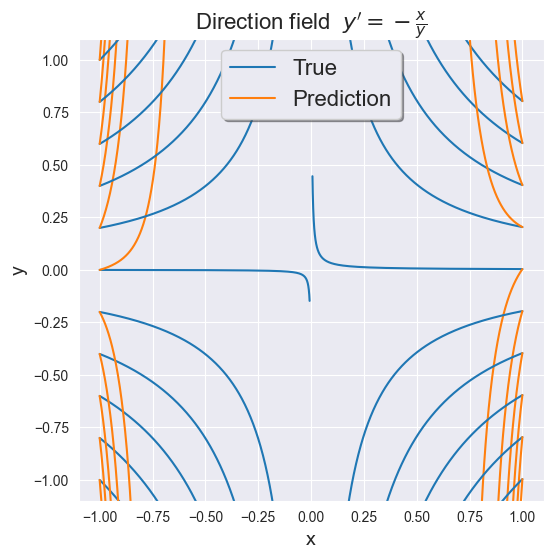

Iter 0200 | Total Loss 120.677704


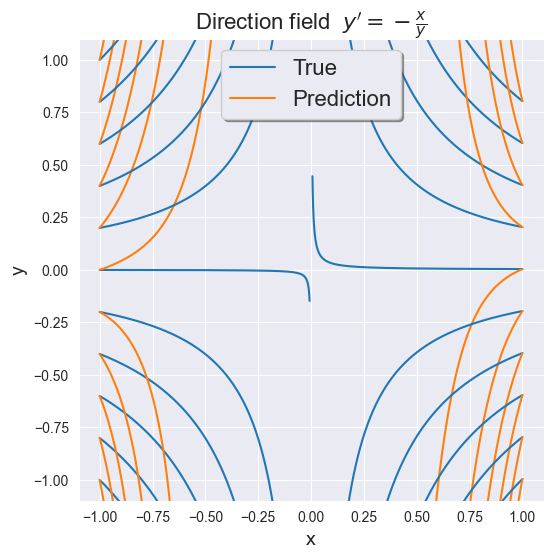

Iter 0300 | Total Loss 81.315216


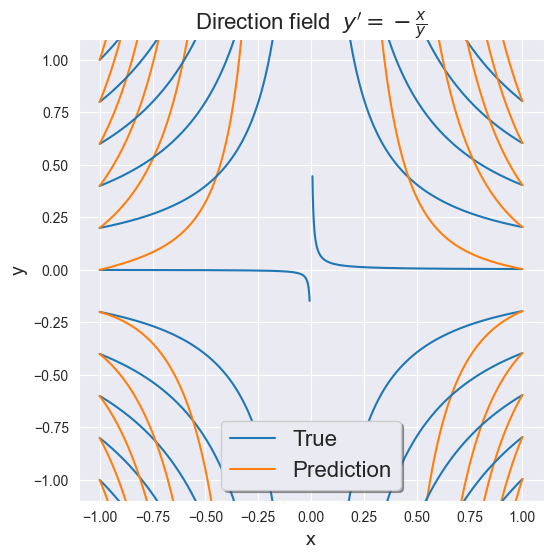

Iter 0400 | Total Loss 63.421787


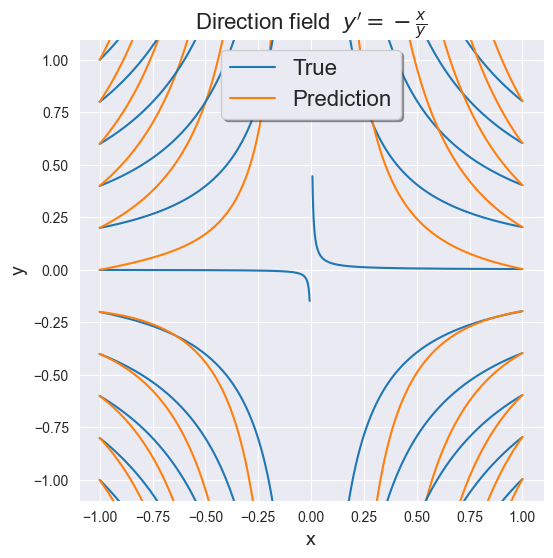

Iter 0500 | Total Loss 61.986519


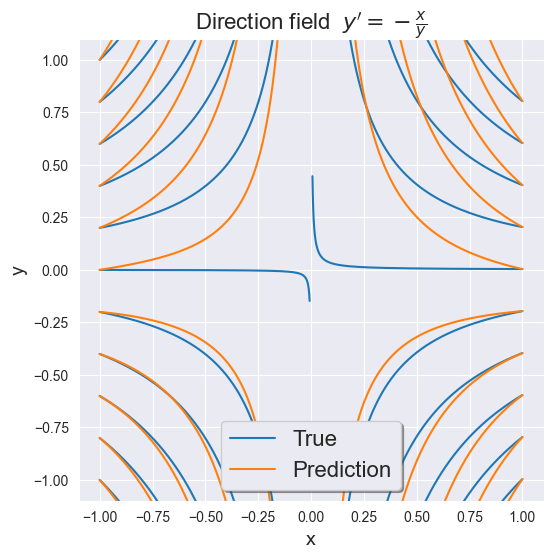

Iter 0600 | Total Loss 50.383831


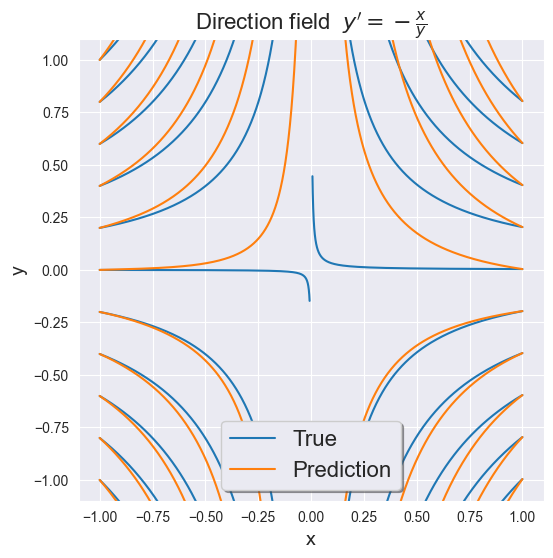

Iter 0700 | Total Loss 41.908260


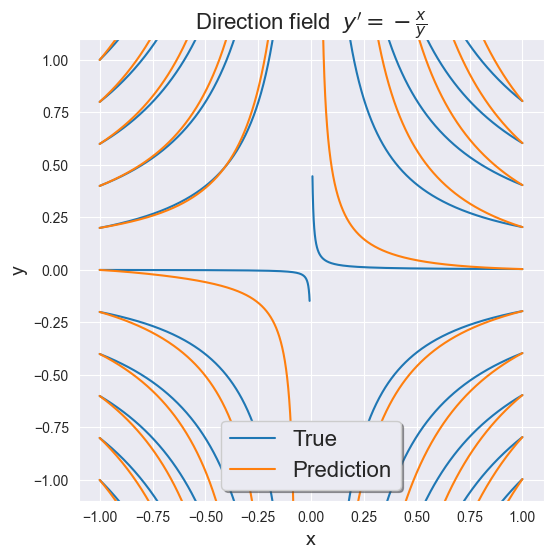

Iter 0800 | Total Loss 35.946560


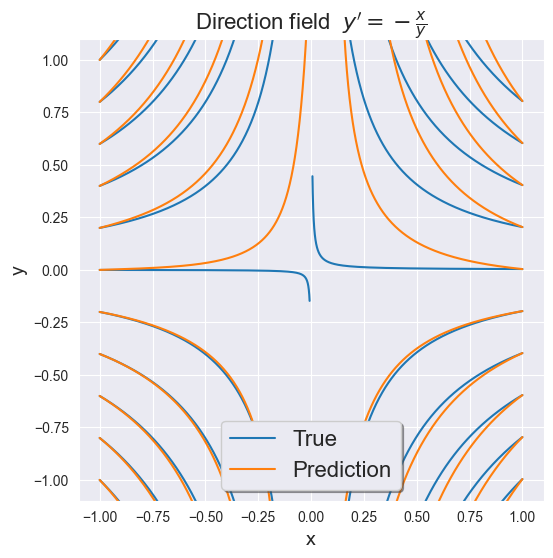

Iter 0900 | Total Loss 21.651937


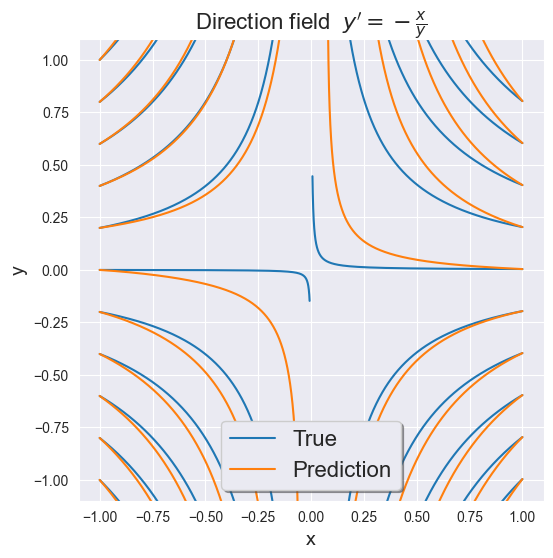

Iter 1000 | Total Loss 16.858477


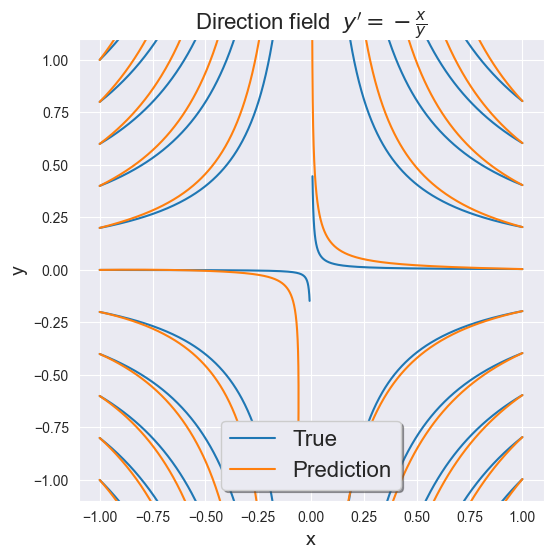

In [305]:
model_saddle = ODE_Net2D()
niters = 1000
test_freq = 100
batch_time = 500
optimizer_saddle = optim.Adam(model_saddle.parameters(), lr=1e-3)
train2D(model_saddle, optimizer_saddle, true_h_saddle, h0s_saddle, t_saddle, batch_time=batch_time, 
              niters=niters, test_freq=test_freq, name=r"  $y' = -\frac{y}{x}$")

In [339]:
def plot_field(true_model, model, t, ax=None, name=""):    
    xs = np.arange(-1, 1.1, 0.1)
    ys = np.arange(-1, 1.1, 0.1)
    X,Y = np.meshgrid(xs,ys)
    h = torch.Tensor(np.stack([X,Y], axis=-1))
    
    true_dh = true_model()(t, h).numpy()
    true_dx, true_dy = true_dh[:,:,0], true_dh[:,:,1]
    true_dy, true_dx = (true_dy + 1e-10) / (np.abs(true_dx) + 1e-10), (true_dx + 1e-10) / (np.abs(true_dx) + 1e-10)
    
    true_ind = np.abs(true_dy) > np.sqrt(2)
    true_coeffs = true_dy[true_ind] / np.sqrt(2)
    true_dy[true_ind] /= true_coeffs
    true_dx[true_ind] /= true_coeffs
    with torch.no_grad():
        neural_dh = model(t, h).numpy()
        neural_dx, neural_dy = neural_dh[:,:,0], neural_dh[:,:,1]
        neural_dy, neural_dx = (neural_dy + 1e-10) / (np.abs(neural_dx) + 1e-10), (neural_dx + 1e-10) / (np.abs(neural_dx) + 1e-10)
        
        neural_ind = np.abs(neural_dy) > np.sqrt(2)
        neural_coeffs = neural_dy[neural_ind] / np.sqrt(2)
        neural_dy[neural_ind] /= neural_coeffs
        neural_dx[neural_ind] /= neural_coeffs
        
    scale = 15
    if ax is not None:
        ax.quiver(X, Y, true_dx, true_dy, color=sns.color_palette()[0], headaxislength=0, headlength=0, 
                pivot="middle", scale_units="xy", width=0.01, scale=scale, label="True", alpha=0.5)
        ax.quiver(X, Y, neural_dx, neural_dy, color=sns.color_palette()[1], headaxislength=0, headlength=0, 
                pivot="middle", scale_units="xy", scale=scale, width=0.003, label="Prediction")
        ax.set_xlabel("x", fontsize=14)
        ax.set_ylabel("y", fontsize=14)
        ax.set_title("Direction field for" + name, fontsize=18)
        ax.legend(shadow=True, fontsize=14, loc="upper left")
    else:
        plt.figure(figsize=(10,10))
        plt.quiver(X, Y, true_dx, true_dy, color=sns.color_palette()[0], headaxislength=0, headlength=0, 
                pivot="middle", scale_units="xy", width=0.01, scale=scale, label="True", alpha=0.5)
        plt.quiver(X, Y, neural_dx, neural_dy, color=sns.color_palette()[1], headaxislength=0, headlength=0, 
                pivot="middle", scale_units="xy", width=0.003, scale=scale, label="Prediction")
        plt.xlabel("x", fontsize=14)
        plt.ylabel("y", fontsize=14)
        plt.title("Direction field for" + name, fontsize=18)
        plt.legend(shadow=True, fontsize=14)

In [340]:
def plot_trajectories(model, h_true, h0s, t, ax=None, name=""):    
    with torch.no_grad():
        h_pred = odeint(model, h0s, t)

    if ax is not None:
        for i in range(0, h_true.shape[1], 100):
            ax.plot(h_true[:,i,0].numpy(), h_true[:,i,1].numpy(), color=sns.color_palette()[0])
            ax.plot(h_pred[:,i,0].numpy(), h_pred[:,i,1].numpy(), color=sns.color_palette()[1])
        ax.set_xlabel('x', fontsize=14)
        ax.set_ylabel('y', fontsize=14)
        ax.set_xlim(left=-1.1, right=1.1)
        ax.set_ylim(bottom=-1.1, top=1.1)
        ax.set_title('Evolution trajectories' + name, fontsize=18)
        ax.legend(['True', 'Prediction'], shadow=True, fontsize=14, loc="upper left")
    else:
        for i in range(0, true_h.shape[1], 100):
            plt.plot(h_true[:,i,0].numpy(), h_true[:,i,1].numpy(), color=sns.color_palette()[0])
            plt.plot(h_pred[:,i,0].numpy(), h_pred[:,i,1].numpy(), color=sns.color_palette()[1])
        plt.xlabel('x', fontsize=14)
        plt.ylabel('y', fontsize=14)
        plt.xlim(left=-1.1, right=1.1)
        plt.ylim(bottom=-1.1, top=1.1)
        plt.title('Direction field' + name, fontsize=18)
        plt.legend(['True', 'Prediction'], shadow=True, fontsize=14)
        plt.show()

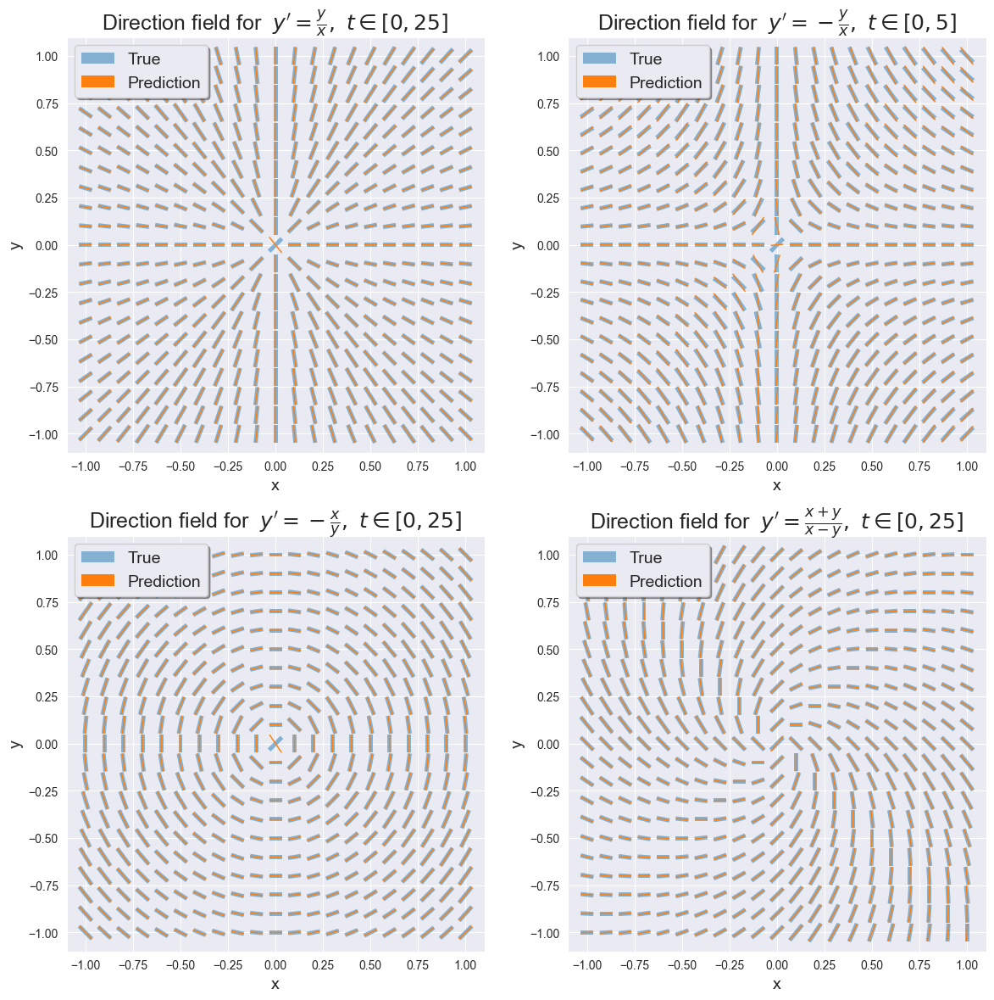

In [341]:
fig, axes = plt.subplots(2, 2, figsize=(14,14))

plot_field(Uniform2D, model_uniform, t_uniform, axes[0][0], name=r"  $y' = \frac{y}{x},~t\in[0,25]$")
plot_field(Saddle2D, model_saddle, t_saddle, axes[0][1], name=r"  $y' = -\frac{y}{x},~t\in[0,5]$")
plot_field(Center, model_center, t_center, axes[1][0], name=r"  $y' = -\frac{x}{y},~t\in[0,25]$")
plot_field(Spiral, model_spiral, t_spiral, axes[1][1], name=r"  $y' = \frac{x+y}{x-y},~t\in[0,25]$")
plt.show()

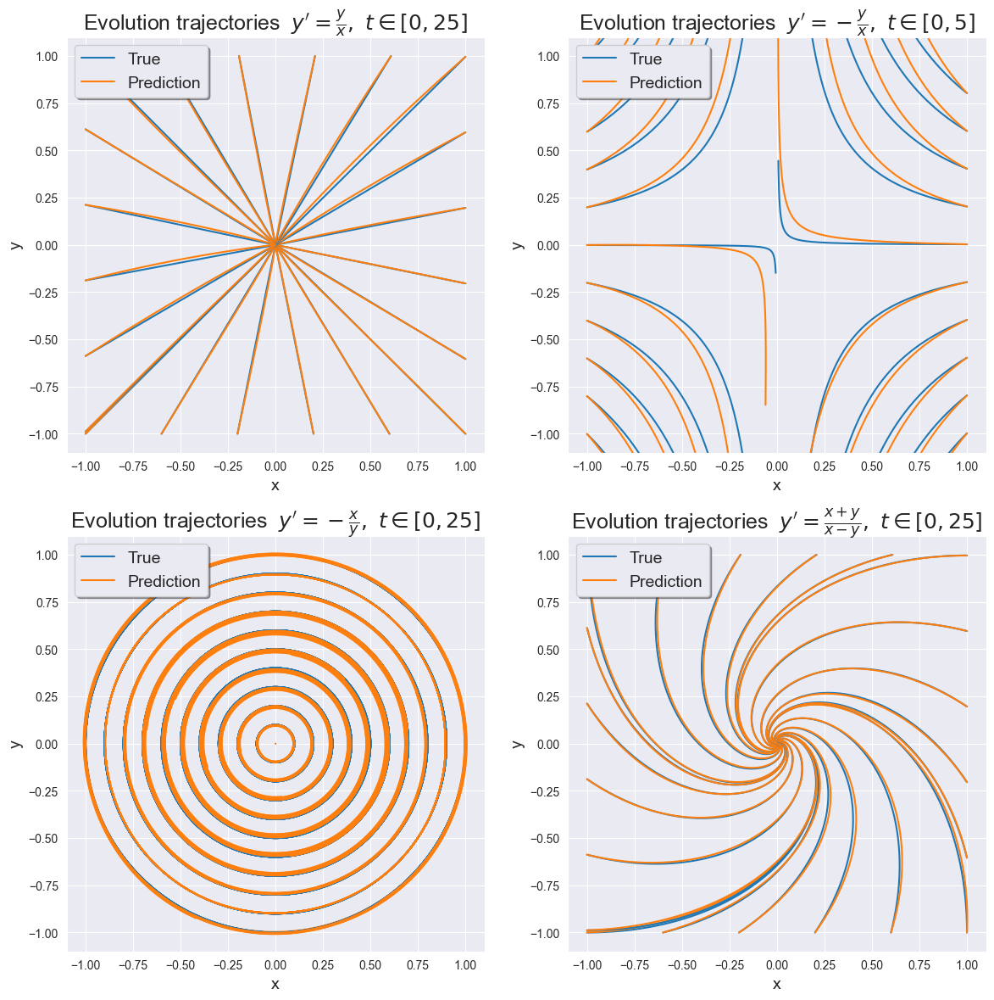

In [342]:
fig, axes = plt.subplots(2, 2, figsize=(14,14))

plot_trajectories(model_uniform, true_h_uniform, h0s_uniform, t_uniform, axes[0][0], name=r"  $y' = \frac{y}{x},~t\in[0,25]$")
plot_trajectories(model_saddle, true_h_saddle, h0s_saddle, t_saddle, axes[0][1], name=r"  $y' = -\frac{y}{x},~t\in[0,5]$")
plot_trajectories(model_center, true_h_center, h0s_center, t_center, axes[1][0], name=r"  $y' = -\frac{x}{y},~t\in[0,25]$")
plot_trajectories(model_spiral, true_h_spiral, h0s_spiral, t_spiral, axes[1][1], name=r"  $y' = \frac{x+y}{x-y},~t\in[0,25]$")
plt.show()